# **ABSTRACT**

The used and refurbished device market has grown considerably over the past decade as it provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing one. Maximizing the longevity of devices through second-hand trade also reduces their environmental impact and helps in recycling and reducing waste. Here is a sample dataset of normalized used and new pricing data of refurbished / used devices.

## **Dataset**

**Variables:**

device_brand: Name of manufacturing brand

os: OS on which the device runs

screen_size: Size of the screen in cm

4g: Whether 4G is available or not

5g: Whether 5G is available or not

front_camera_mp: Resolution of the rear camera in megapixels

back_camera_mp: Resolution of the front camera in megapixels

internal_memory: Amount of internal memory (ROM) in GB

ram: Amount of RAM in GB

battery: Energy capacity of the device battery in mAh

weight: Weight of the device in grams

release_year: Year when the device model was released

days_used: Number of days the used/refurbished device has been used

normalized_new_price: Normalized price of a new device of the same model

normalized_used_price (TARGET): Normalized price of the used/refurbished device

**Numerical Datatypes:**

screen_size: Size of the screen in cm

front_camera_mp: Resolution of the rear camera in megapixels

back_camera_mp: Resolution of the front camera in megapixels

internal_memory: Amount of internal memory (ROM) in GB

ram: Amount of RAM in GB

battery: Energy capacity of the device battery in mAh

weight: Weight of the device in grams

release_year: Year when the device model was released

days_used: Number of days the used/refurbished device has been used

normalized_new_price: Normalized price of a new device of the same model

normalized_used_price (TARGET): Normalized price of the used/refurbished device

**Categorical:**

device_brand: Name of manufacturing brand
os: OS on which the device runs
4g: Whether 4G is available or not
5g: Whether 5G is available or not

## **Installing dependencies**

In [1]:
!pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 64.1 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [2]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor

from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=373f2b9b68ee9bf8783170cf49e43c829518353bee2307ef89541e17ee31313e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.3/265.3 MB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.2-py2.py3-none-any.whl size=265363806 sha256=36d7b9b6fc1b2763c79f4dc562721db35be7d217f90968a9b724e718b80f3b48
  Stored in directory: /root/.cache/pip/wheels/e9/ea/ab/889709967692e30c57c46137edd2cae6b2768bb65ec7cb8aa5
Successfully built h2o


In [3]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [4]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [5]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:49898..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp3cl0sp7n
  JVM stdout: /tmp/tmp3cl0sp7n/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp3cl0sp7n/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:49898
Connecting to H2O server at http://127.0.0.1:49898 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,25 days
H2O_cluster_name:,H2O_from_python_unknownUser_lhmew7
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [7]:
# Reading CSV file into Pandas DataFrame
udd_df = pd.read_csv("https://raw.githubusercontent.com/nawani-rohit/model_interpretability/main/used_device_data.csv")

In [8]:
udd_df.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837


In [9]:
udd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3454 entries, 0 to 3453
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   device_brand           3454 non-null   object 
 1   os                     3454 non-null   object 
 2   screen_size            3454 non-null   float64
 3   4g                     3454 non-null   object 
 4   5g                     3454 non-null   object 
 5   rear_camera_mp         3275 non-null   float64
 6   front_camera_mp        3452 non-null   float64
 7   internal_memory        3450 non-null   float64
 8   ram                    3450 non-null   float64
 9   battery                3448 non-null   float64
 10  weight                 3447 non-null   float64
 11  release_year           3454 non-null   int64  
 12  days_used              3454 non-null   int64  
 13  normalized_used_price  3454 non-null   float64
 14  normalized_new_price   3454 non-null   float64
dtypes: f

In [10]:
udd_df.describe()

,screen_size,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
count,3454.000000,3275.000000,3452.000000,3450.000000,3450.000000,3448.000000,3447.000000,3454.000000,3454.000000,3454.000000,3454.000000
mean,13.713115,9.460208,6.554229,54.573099,4.036122,3133.402697,182.751871,2015.965258,674.869716,4.364712,5.233107
std,3.805280,4.815461,6.970372,84.972371,1.365105,1299.682844,88.413228,2.298455,248.580166,0.588914,0.683637
min,5.080000,0.080000,0.000000,0.010000,0.020000,500.000000,69.000000,2013.000000,91.000000,1.536867,2.901422
25%,12.700000,5.000000,2.000000,16.000000,4.000000,2100.000000,142.000000,2014.000000,533.500000,4.033931,4.790342
50%,12.830000,8.000000,5.000000,32.000000,4.000000,3000.000000,160.000000,2015.500000,690.500000,4.405133,5.245892
75%,15.340000,13.000000,8.000000,64.000000,4.000000,4000.000000,185.000000,2018.000000,868.750000,4.755700,5.673718
max,30.710000,48.000000,32.000000,1024.000000,12.000000,9720.000000,855.000000,2020.000000,1094.000000,6.619433,7.847841


In [11]:
udd_df.isnull().sum()

device_brand               0
os                         0
screen_size                0
4g                         0
5g                         0
rear_camera_mp           179
front_camera_mp            2
internal_memory            4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64

In [12]:
udd_df.dropna(axis=0, how='any', subset=None, inplace=True)

In [13]:
udd_df.isnull().sum()

device_brand             0
os                       0
screen_size              0
4g                       0
5g                       0
rear_camera_mp           0
front_camera_mp          0
internal_memory          0
ram                      0
battery                  0
weight                   0
release_year             0
days_used                0
normalized_used_price    0
normalized_new_price     0
dtype: int64

# **Fitting a Linear Model**

In [14]:
udd_df.duplicated().sum()

0

no duplicate values found here

**One HOT ENCODING FOR '4g' and '5g' variables**

In [15]:
dict_G = {'yes':1,'no':0}

In [16]:
udd_df['4g'] = udd_df['4g'].map(dict_G)

In [17]:
udd_df['5g'] = udd_df['5g'].map(dict_G)

**mapping device brand into median values of each normalised_used_price for each brand**

In [19]:
brand_dict = udd_df.groupby(['device_brand'])['normalized_used_price'].median().to_dict()
udd_df['Device_Brand'] = udd_df['device_brand'].map(brand_dict)

In [20]:
udd_df.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price,Device_Brand
0,Honor,Android,14.50,1,0,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100,4.683326
1,Honor,Android,17.30,1,1,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018,4.683326
2,Honor,Android,16.69,1,1,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631,4.683326
3,Honor,Android,25.50,1,1,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961,4.683326
4,Honor,Android,15.32,1,0,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837,4.683326


In [21]:
udd_df = udd_df[['os','screen_size', '4g','5g', 'release_year', 'days_used',
             'normalized_used_price', 'normalized_new_price', 'rear_camera_mp',
             'front_camera_mp', 'internal_memory',
             'ram', 'battery', 'weight', 'Device_Brand']]

In [22]:
udd_df.head()

,os,screen_size,4g,5g,release_year,days_used,normalized_used_price,normalized_new_price,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,Device_Brand
0,Android,14.50,1,0,2020,127,4.307572,4.715100,13.0,5.0,64.0,3.0,3020.0,146.0,4.683326
1,Android,17.30,1,1,2020,325,5.162097,5.519018,13.0,16.0,128.0,8.0,4300.0,213.0,4.683326
2,Android,16.69,1,1,2020,162,5.111084,5.884631,13.0,8.0,128.0,8.0,4200.0,213.0,4.683326
3,Android,25.50,1,1,2020,345,5.135387,5.630961,13.0,8.0,64.0,6.0,7250.0,480.0,4.683326
4,Android,15.32,1,0,2020,293,4.389995,4.947837,13.0,8.0,64.0,3.0,5000.0,185.0,4.683326


**Using Dummies to encode OS into numerical features**

In [23]:
udd_df = pd.get_dummies(udd_df)

In [24]:
udd_df.head()

,screen_size,4g,5g,release_year,days_used,normalized_used_price,normalized_new_price,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,Device_Brand,os_Android,os_Others,os_Windows,os_iOS
0,14.50,1,0,2020,127,4.307572,4.715100,13.0,5.0,64.0,3.0,3020.0,146.0,4.683326,1,0,0,0
1,17.30,1,1,2020,325,5.162097,5.519018,13.0,16.0,128.0,8.0,4300.0,213.0,4.683326,1,0,0,0
2,16.69,1,1,2020,162,5.111084,5.884631,13.0,8.0,128.0,8.0,4200.0,213.0,4.683326,1,0,0,0
3,25.50,1,1,2020,345,5.135387,5.630961,13.0,8.0,64.0,6.0,7250.0,480.0,4.683326,1,0,0,0
4,15.32,1,0,2020,293,4.389995,4.947837,13.0,8.0,64.0,3.0,5000.0,185.0,4.683326,1,0,0,0


In [25]:
print(udd_df.dtypes)

screen_size              float64
4g                         int64
5g                         int64
release_year               int64
days_used                  int64
normalized_used_price    float64
normalized_new_price     float64
rear_camera_mp           float64
front_camera_mp          float64
internal_memory          float64
ram                      float64
battery                  float64
weight                   float64
Device_Brand             float64
os_Android                 uint8
os_Others                  uint8
os_Windows                 uint8
os_iOS                     uint8
dtype: object


In [26]:
X = udd_df.drop(["normalized_used_price"], axis=1)  # Training Feature
Y = udd_df["normalized_used_price"]  # Target

In [27]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

**Fitting a Linear Model**

In [28]:
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [ ]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = udd_df.drop("normalized_used_price", axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, udd_df.normalized_used_price), 1)

In [30]:
df_norm.head()

,screen_size,4g,5g,release_year,days_used,normalized_new_price,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,Device_Brand,os_Android,os_Others,os_Windows,os_iOS,normalized_used_price
0,0.367538,1.0,0.0,1.0,0.035892,0.366665,0.269616,0.15625,0.062491,0.248748,0.273319,0.097964,0.826635,1.0,0.0,0.0,0.0,4.307572
1,0.476785,1.0,1.0,1.0,0.233300,0.529190,0.269616,0.50000,0.124991,0.666110,0.412148,0.183206,0.826635,1.0,0.0,0.0,0.0,5.162097
2,0.452985,1.0,1.0,1.0,0.070788,0.603105,0.269616,0.25000,0.124991,0.666110,0.401302,0.183206,0.826635,1.0,0.0,0.0,0.0,5.111084
3,0.796723,1.0,1.0,1.0,0.253240,0.551821,0.269616,0.25000,0.062491,0.499165,0.732104,0.522901,0.826635,1.0,0.0,0.0,0.0,5.135387
4,0.399532,1.0,0.0,1.0,0.201396,0.413717,0.269616,0.25000,0.062491,0.248748,0.488069,0.147583,0.826635,1.0,0.0,0.0,0.0,4.389995


In [31]:
df_norm = df_norm.rename(columns={'4g': 'g4'})
df_norm = df_norm.rename(columns={'5g': 'g5'})

In [32]:
import statsmodels.formula.api as smf  # OLS model Library

model = smf.ols('normalized_used_price ~ screen_size + g4 + g5 + release_year + days_used + normalized_new_price + rear_camera_mp + front_camera_mp + internal_memory + ram + battery + weight + Device_Brand + os_Android + os_Others + os_Windows + os_iOS', data=df_norm).fit()

# Print out the statistics
print(model.summary())


                              OLS Regression Results                             
Dep. Variable:     normalized_used_price   R-squared:                       0.838
Model:                               OLS   Adj. R-squared:                  0.837
Method:                    Least Squares   F-statistic:                     1045.
Date:                   Sun, 03 Dec 2023   Prob (F-statistic):               0.00
Time:                           21:25:27   Log-Likelihood:                 118.96
No. Observations:                   3253   AIC:                            -203.9
Df Residuals:                       3236   BIC:                            -100.4
Df Model:                             16                                         
Covariance Type:               nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
In

## **Interpreting Regression Co-efficients**

**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

As seen in the co-efficient coloumn in the above table,

* The R-squared value of 0.838 indicates that approximately 84% of the variance
in the target variable can be explained by the independent variables included in the model. This is a good indication that the model is a reasonably good fit to the data.
* The F-statistic of 1045 and its associated p-value of 0.00 indicates that the model is statistically significant, meaning that at least one of the independent variables in the model is significantly related to the target variable.
* Looking at the coefficients of the independent variables, we can see that several of them are statistically significant at the 0.05 level, such as screen_size, g4, release_year, normalized_new_price, rear_camera_mp, front_camera_mp, ram, battery, and weight. These coefficients represent the expected change in the target variable for a one-unit increase in the corresponding independent variable, while holding all other variables constant.
* The intercept coefficient is not statistically significant, indicating that the model's intercept may not be useful in explaining the variability in the target variable.
There are some independent variables that are not statistically significant, such as g5, days_used, internal_memory, and the OS-related variables (os_Android, os_Others, os_Windows, and os_iOS).
* The high magnitude of the intercept coefficient and some of the independent variable coefficients (such as the Device_Brand variable) suggests that there may be issues with multicollinearity or the design matrix may be singular. These issues can result in unstable and unreliable coefficient estimates and may require further investigation.

* Omnibus is 259.342, with a p-value of 0.000, indicating that the residuals are not normally distributed.
* Durbin-Watson is 1.856, which is close to 2, suggesting that there is no significant autocorrelation among the residuals.
* The Prob(Omnibus) is the probability of obtaining the Omnibus statistic. In this case, the p-value is 0.000, indicating that the residuals are not normally distributed.
* JB is 585.425, with a p-value of 7.53e-128, indicating that the residuals are not normally distributed.
* skewness is -0.497, indicating that the distribution of residuals is slightly negatively skewed.
* The Prob(JB) is the probability of obtaining the Jarque-Bera statistic. In this case, the p-value is 7.53e-128, indicating that the residuals are not normally distributed.
* Kurtosis is a measure of the peakedness of the distribution of residuals. A value of 3 indicates a normal distribution. In this case, the kurtosis is 4.825, indicating that the distribution of residuals is leptokurtic (i.e., has heavier tails than a normal distribution).

# **Fit Tree Based Model**

In [33]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

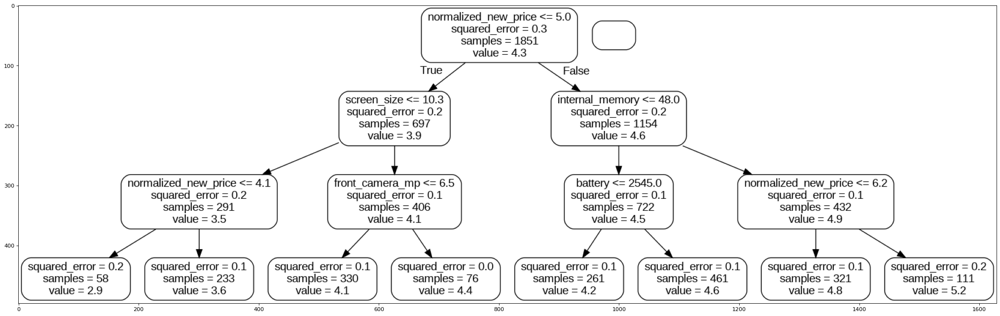

In [34]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

## **Interpreting Nodes of a Tree-Based Model**

In [37]:
from sklearn.tree import export_text
tree = tree_model.estimators_[0]
tree_rules = export_text(tree, feature_names=list(x_train.columns))

print(tree_rules)

|--- normalized_new_price <= 5.01
|   |--- screen_size <= 10.32
|   |   |--- normalized_new_price <= 4.07
|   |   |   |--- value: [2.89]
|   |   |--- normalized_new_price >  4.07
|   |   |   |--- value: [3.63]
|   |--- screen_size >  10.32
|   |   |--- front_camera_mp <= 6.50
|   |   |   |--- value: [4.07]
|   |   |--- front_camera_mp >  6.50
|   |   |   |--- value: [4.39]
|--- normalized_new_price >  5.01
|   |--- internal_memory <= 48.00
|   |   |--- battery <= 2545.00
|   |   |   |--- value: [4.24]
|   |   |--- battery >  2545.00
|   |   |   |--- value: [4.57]
|   |--- internal_memory >  48.00
|   |   |--- normalized_new_price <= 6.16
|   |   |   |--- value: [4.80]
|   |   |--- normalized_new_price >  6.16
|   |   |   |--- value: [5.24]



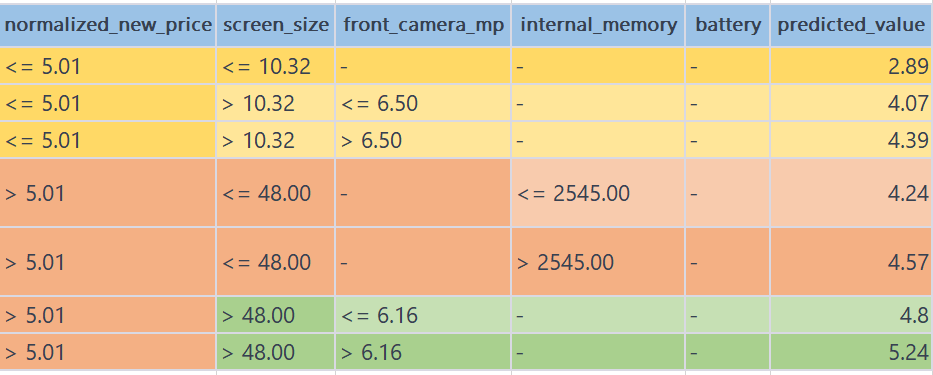

In [38]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [39]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: normalized_new_price Importance: 0.63
Variable: screen_size          Importance: 0.21
Variable: internal_memory      Importance: 0.11
Variable: battery              Importance: 0.03
Variable: rear_camera_mp       Importance: 0.02
Variable: front_camera_mp      Importance: 0.01
Variable: 4g                   Importance: 0.0
Variable: 5g                   Importance: 0.0
Variable: release_year         Importance: 0.0
Variable: days_used            Importance: 0.0
Variable: ram                  Importance: 0.0
Variable: weight               Importance: 0.0
Variable: Device_Brand         Importance: 0.0
Variable: os_Android           Importance: 0.0
Variable: os_Others            Importance: 0.0
Variable: os_Windows           Importance: 0.0
Variable: os_iOS               Importance: 0.0


The tree-based regressor's variable importance supports and strengthens our understanding gained from the linear model.

# **Getting best model using H2O AutoML**

In [40]:
udd_hf = h2o.H2OFrame(udd_df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [41]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = udd_hf.split_frame([pct_rows])

In [42]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "normalized_used_price"

    X.remove(y)  # Removing the result frm our predictors data


    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [43]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [44]:
autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20231203_213132,0.220648,0.0486856,0.175431,0.0428019,0.0486856
StackedEnsemble_BestOfFamily_4_AutoML_1_20231203_213132,0.220956,0.0488216,0.175668,0.0428197,0.0488216
GBM_grid_1_AutoML_1_20231203_213132_model_2,0.221344,0.0489931,0.17619,0.0429058,0.0489931
StackedEnsemble_AllModels_2_AutoML_1_20231203_213132,0.222815,0.0496464,0.17693,0.0430306,0.0496464
StackedEnsemble_BestOfFamily_3_AutoML_1_20231203_213132,0.222948,0.0497058,0.177028,0.0430502,0.0497058
GBM_5_AutoML_1_20231203_213132,0.223751,0.0500647,0.17786,0.0432007,0.0500647
StackedEnsemble_BestOfFamily_2_AutoML_1_20231203_213132,0.22414,0.0502388,0.177994,0.0432693,0.0502388
StackedEnsemble_AllModels_1_AutoML_1_20231203_213132,0.224406,0.0503582,0.178141,0.0432901,0.0503582
GBM_grid_1_AutoML_1_20231203_213132_model_9,0.224579,0.0504358,0.177549,0.043728,0.0504358
GBM_2_AutoML_1_20231203_213132,0.225293,0.0507569,0.179101,0.043438,0.0507569


In [45]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

2
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20231203_213132_model_2


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    58                 58                          13388                  4            4            4             6             16            13.7759

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.03642604450961791
RMSE: 0.19085608323974876
MAE: 0.15439147126194863
RMSLE: 0.03669430241642955
Mean Residual Deviance: 0.03642604450961791

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.04899311193165855
RMSE: 0.22134387710451478
MAE: 0.1761904168030204
RMSLE: 0.042905793867810474
Mean Residual

### **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

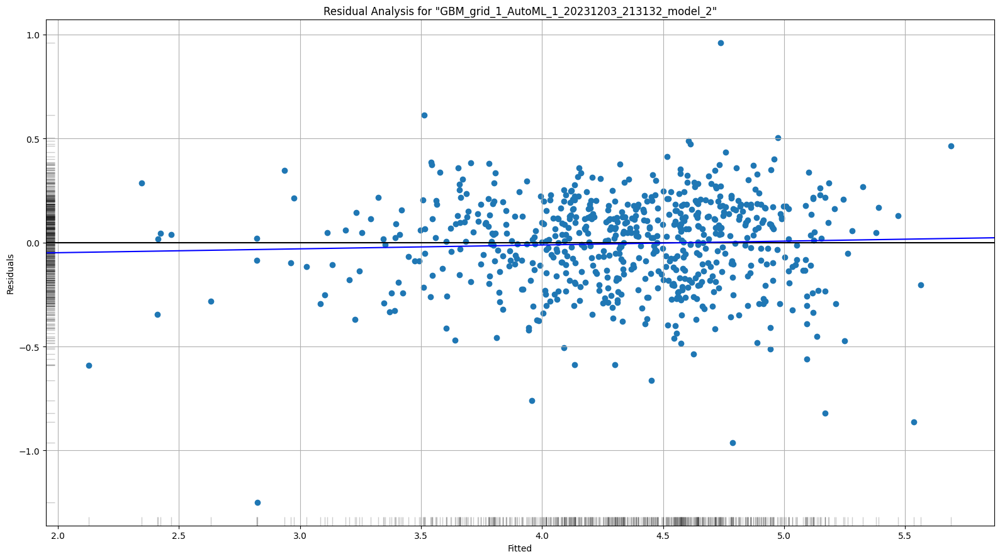

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

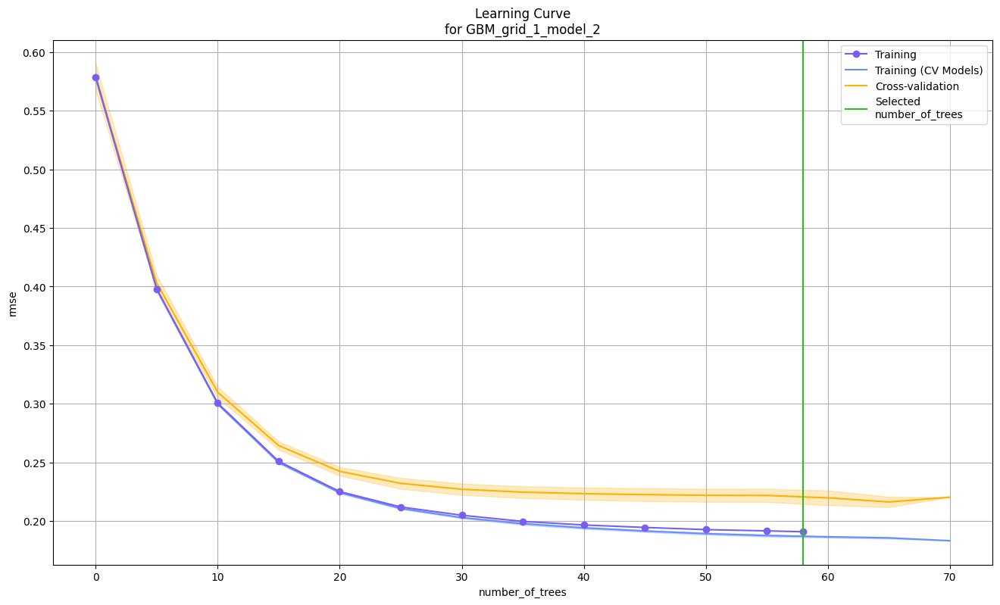

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

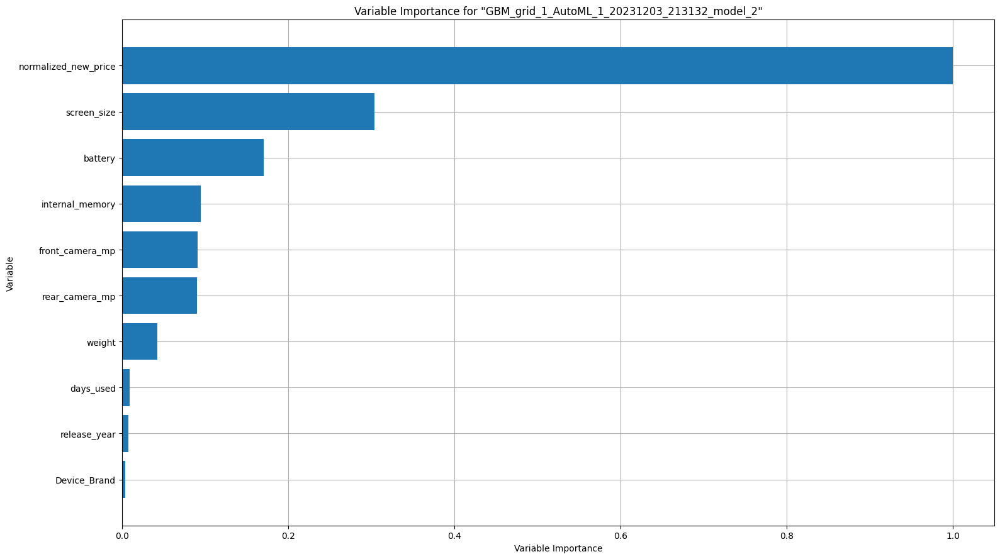

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

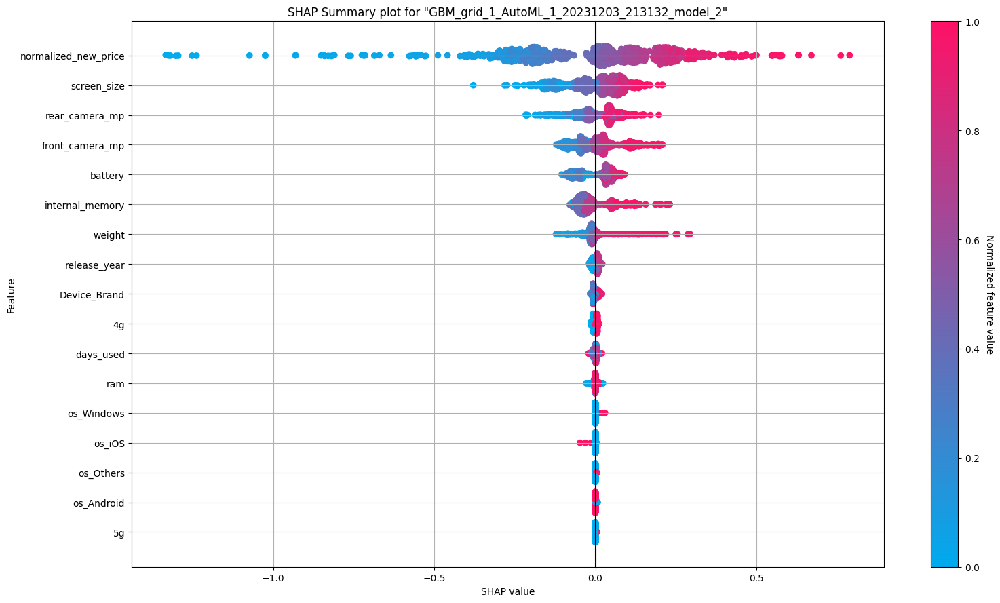

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

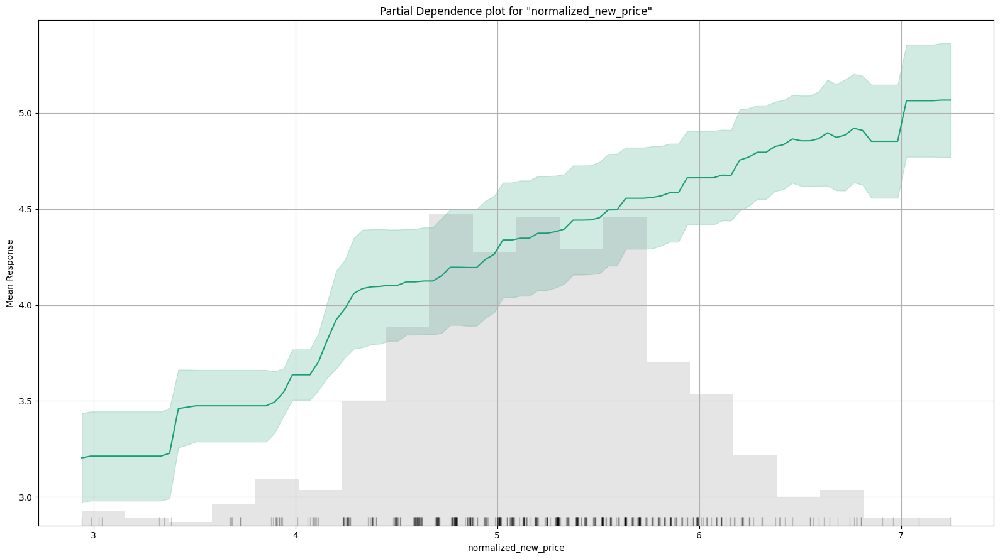

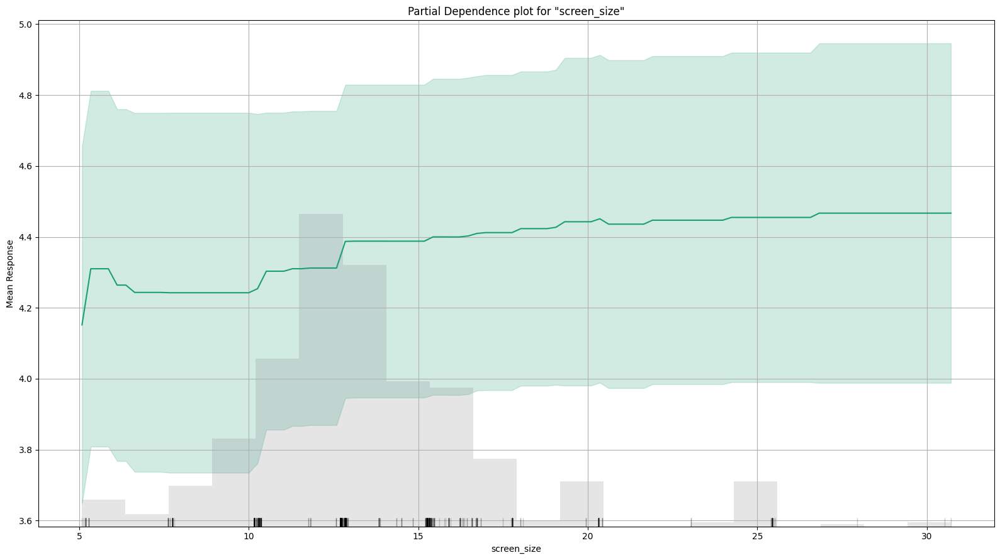

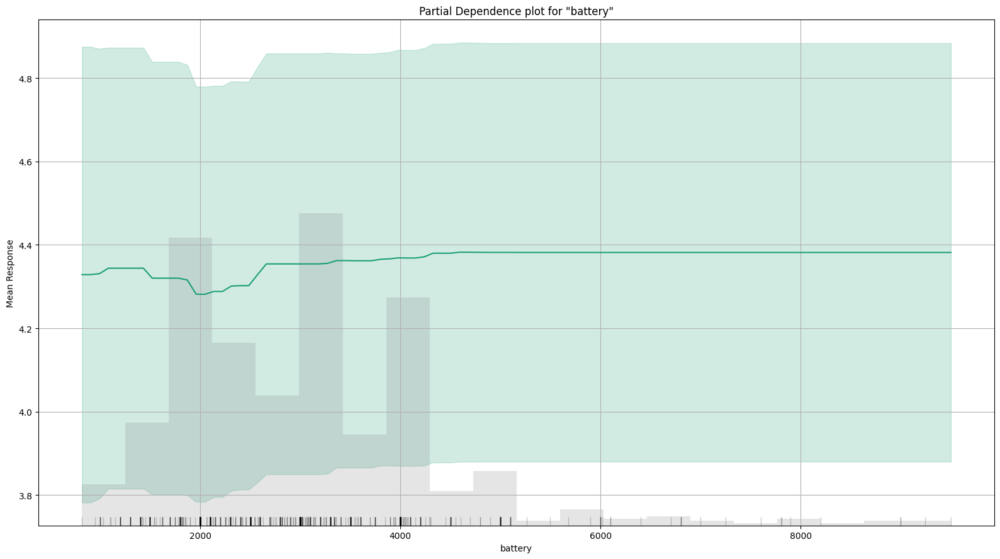

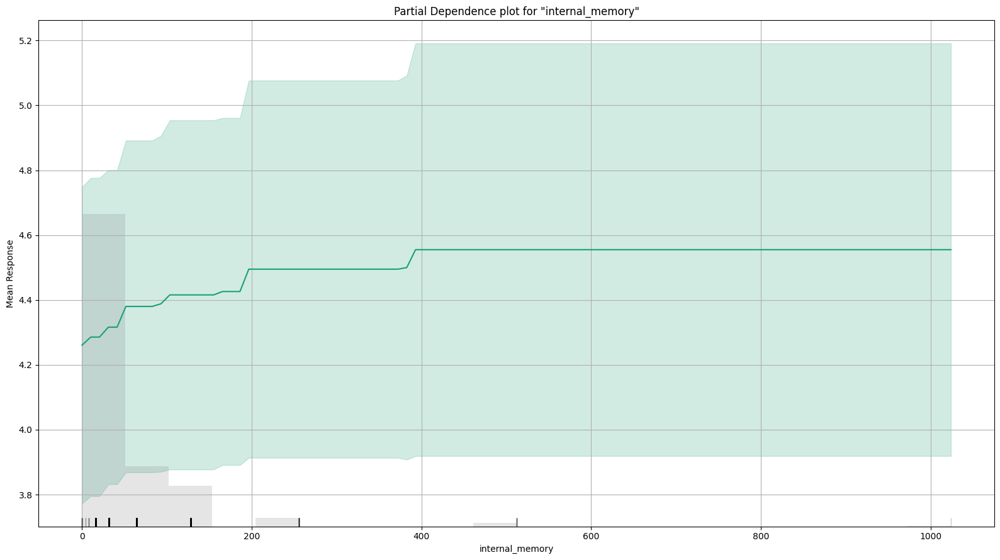

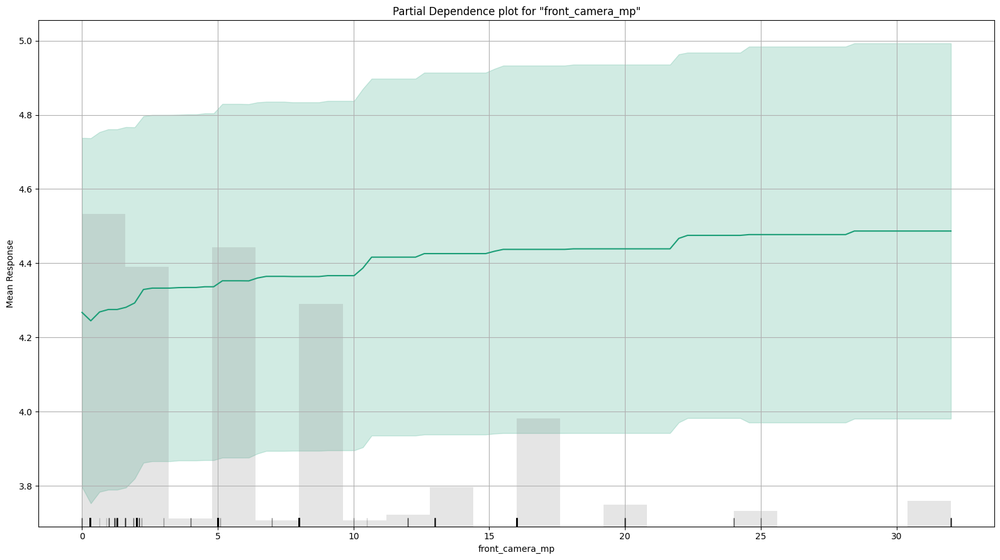

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

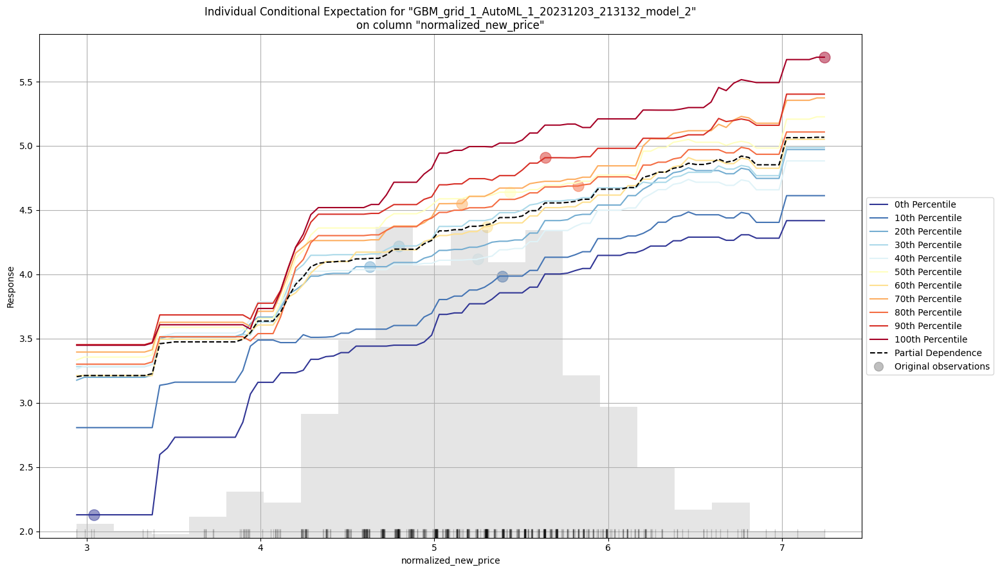

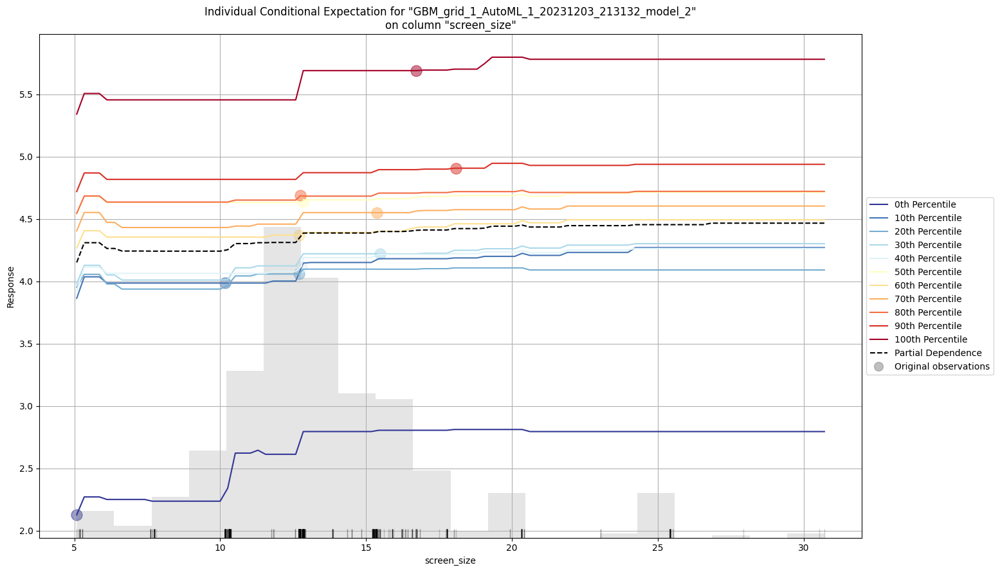

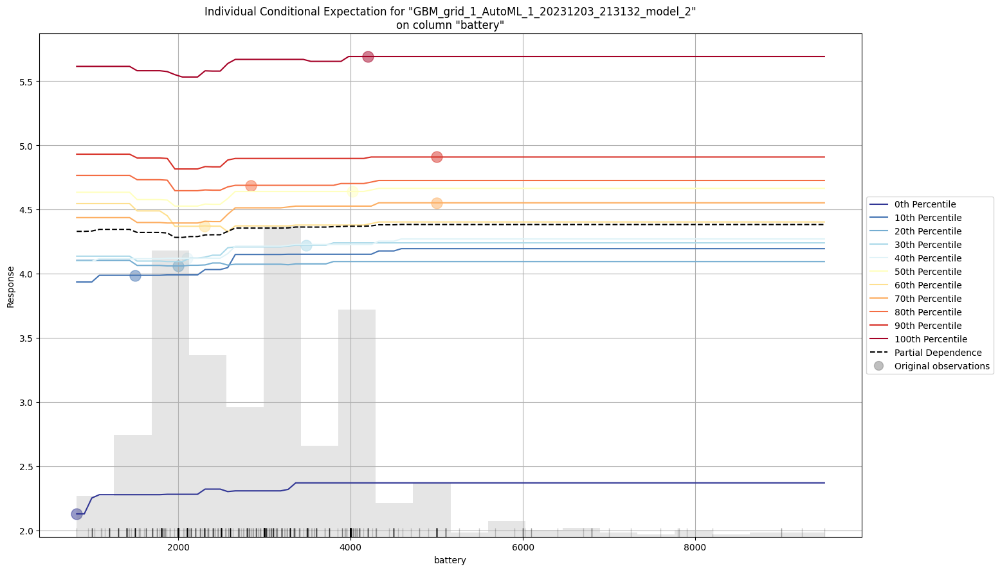

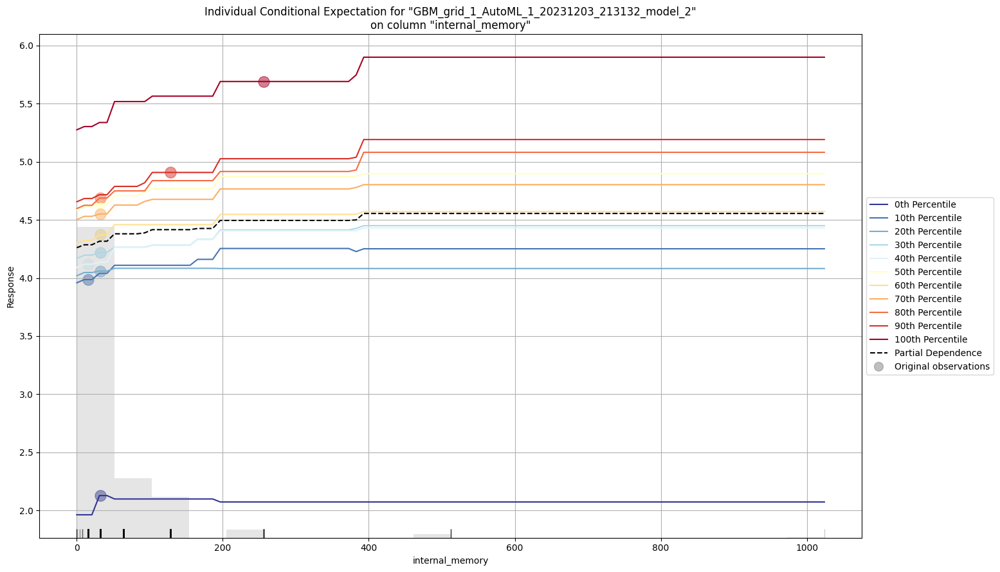

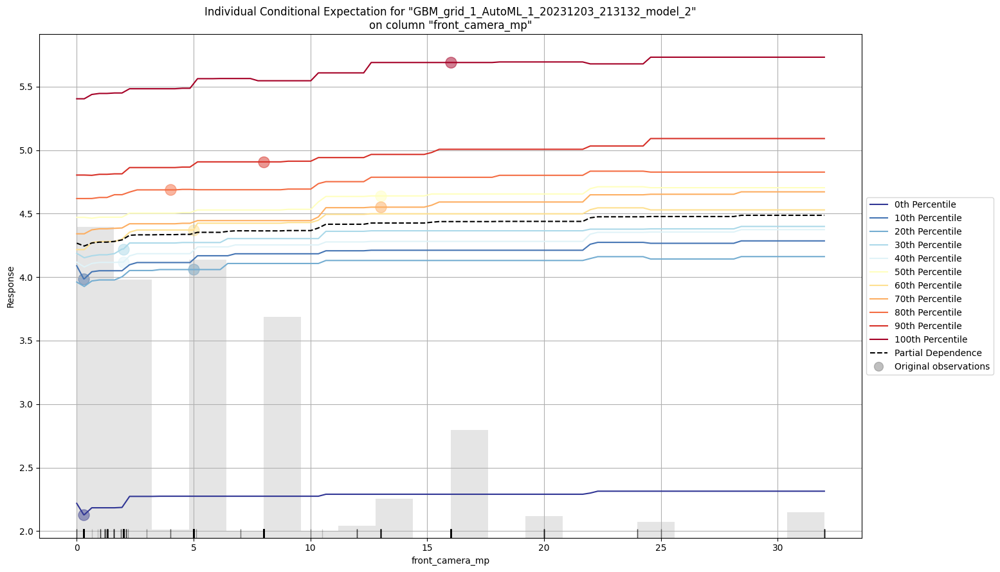

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

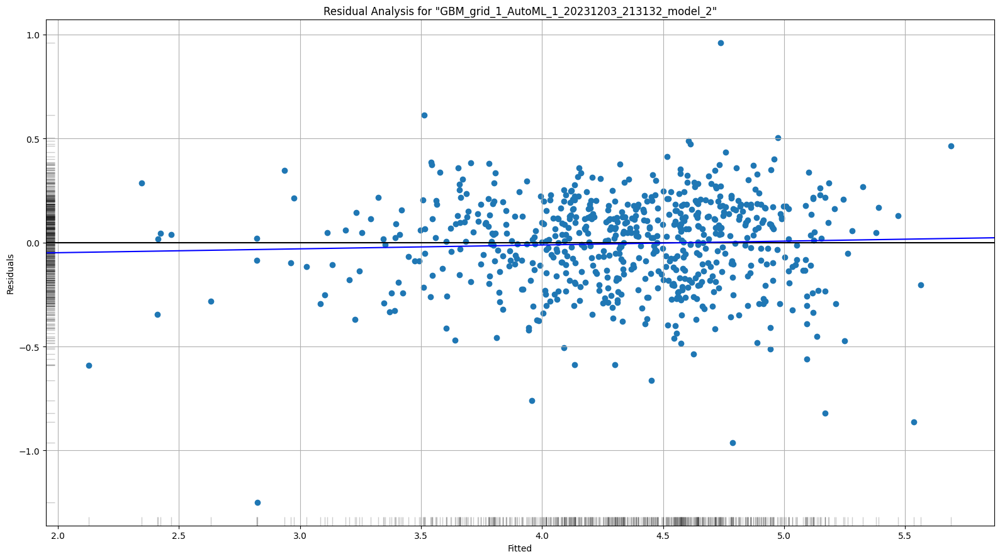

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

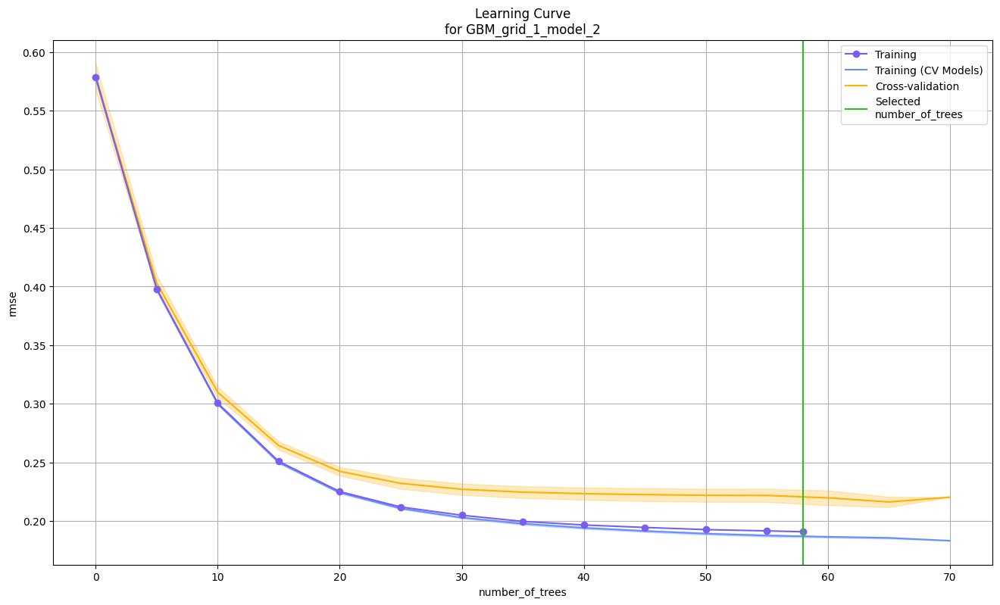

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

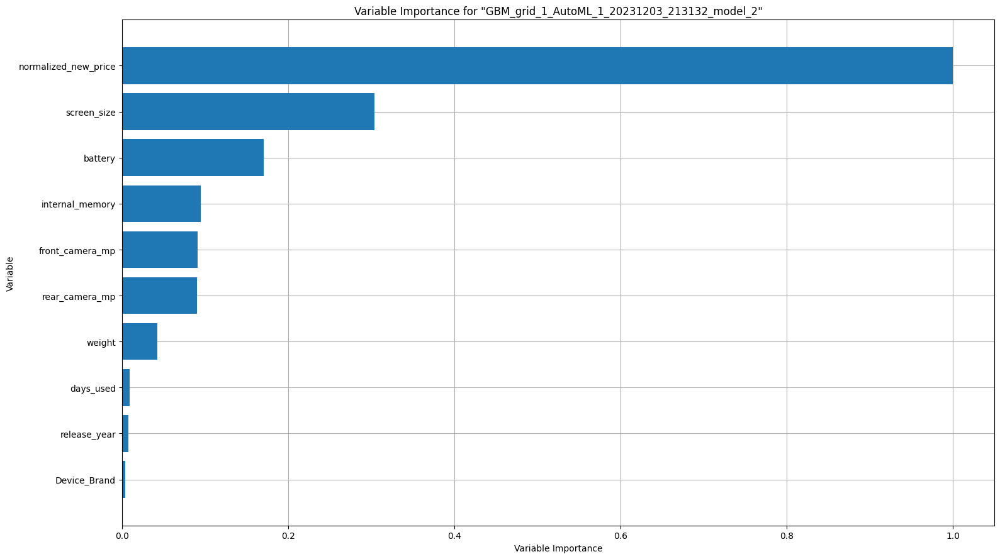

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

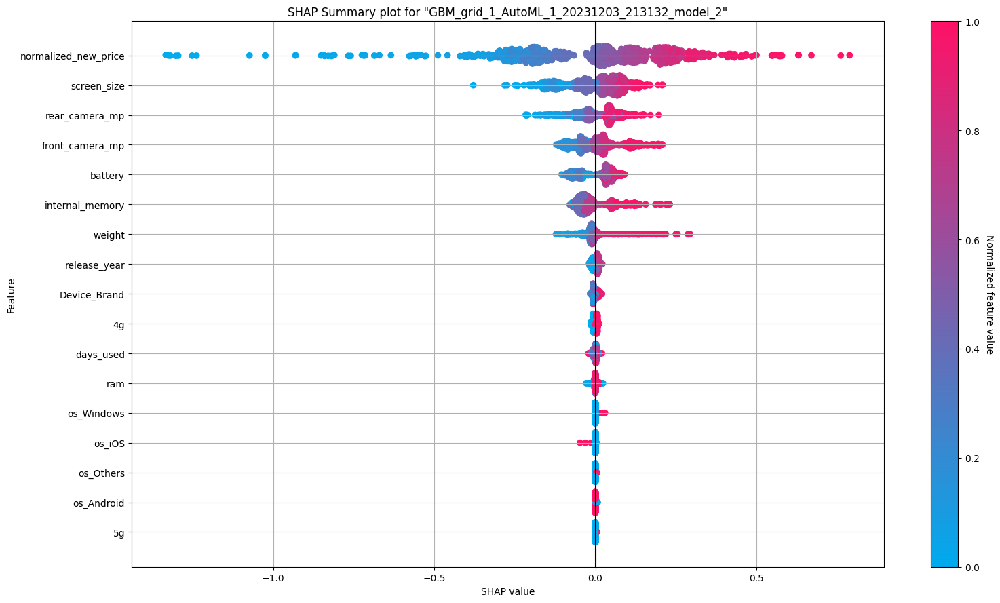

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

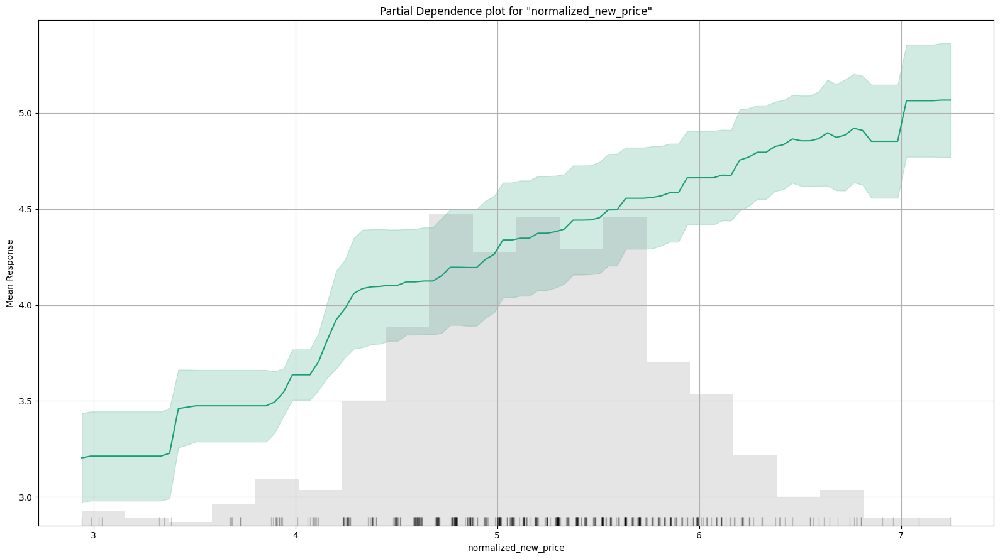

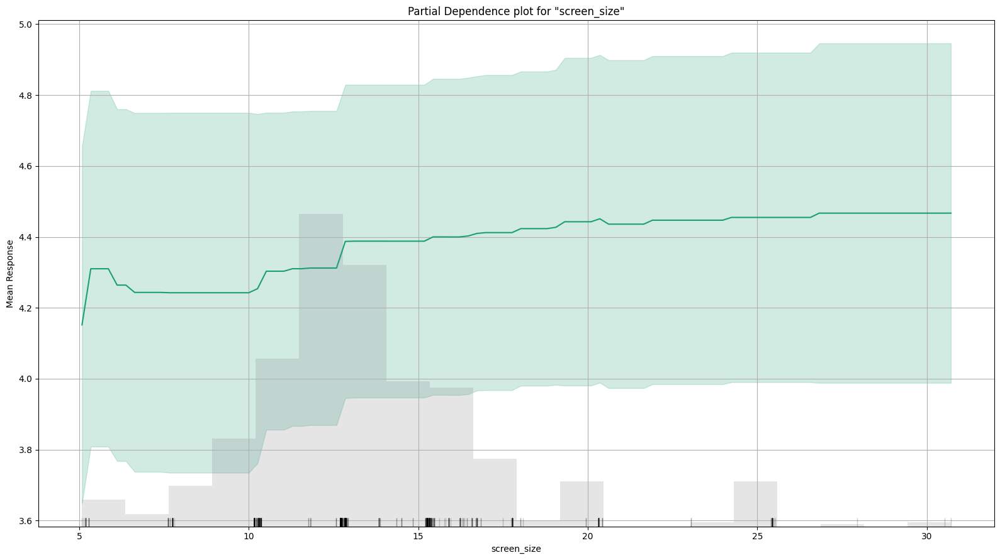

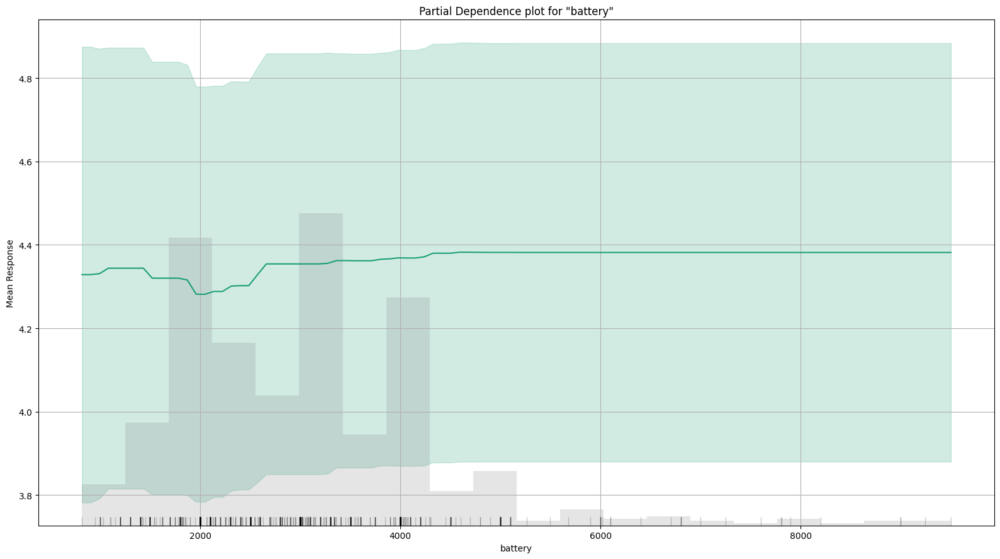

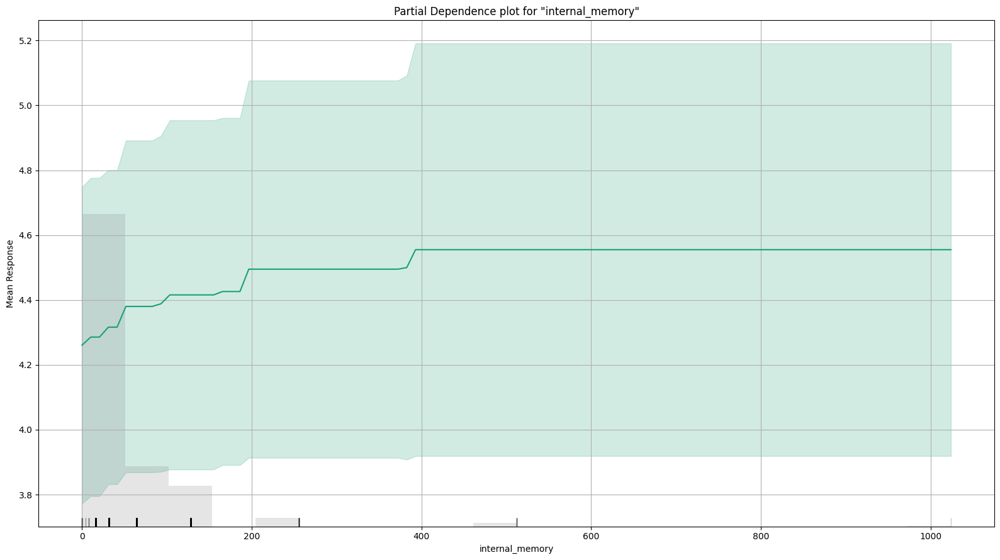

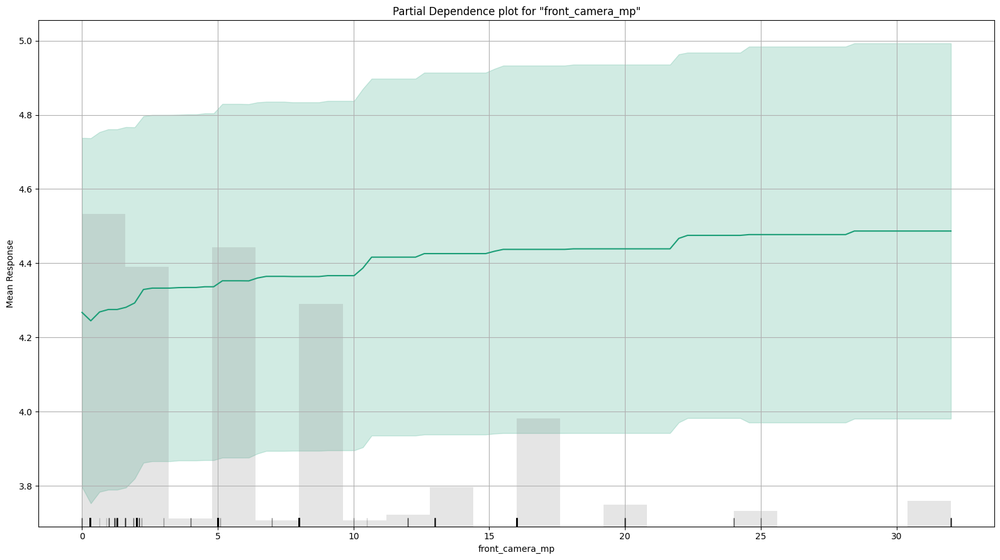

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

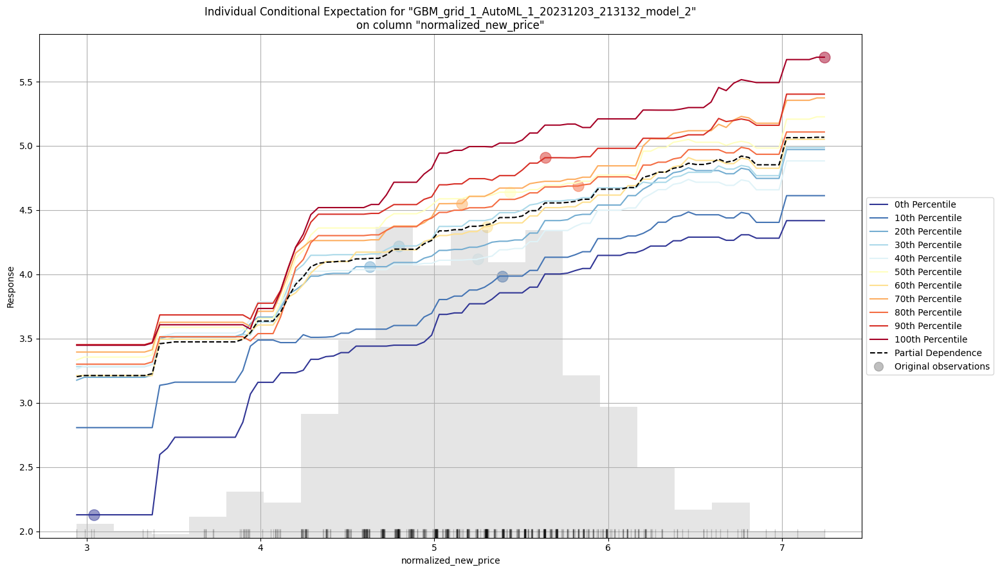

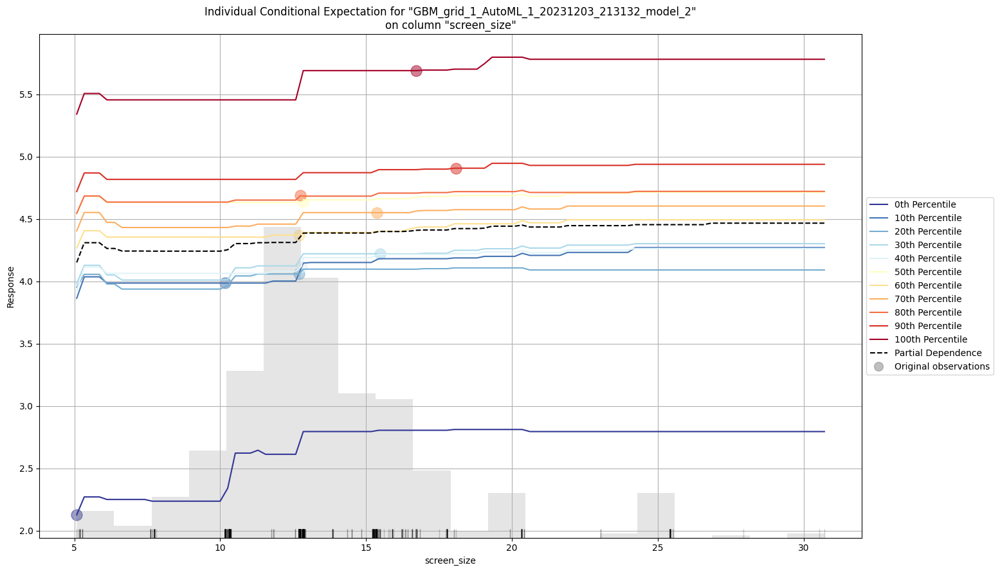

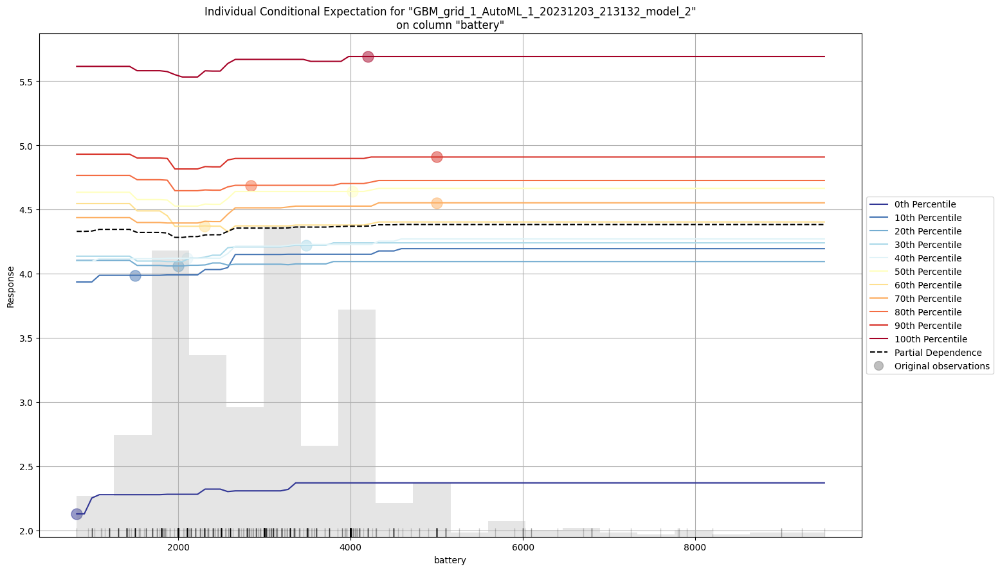

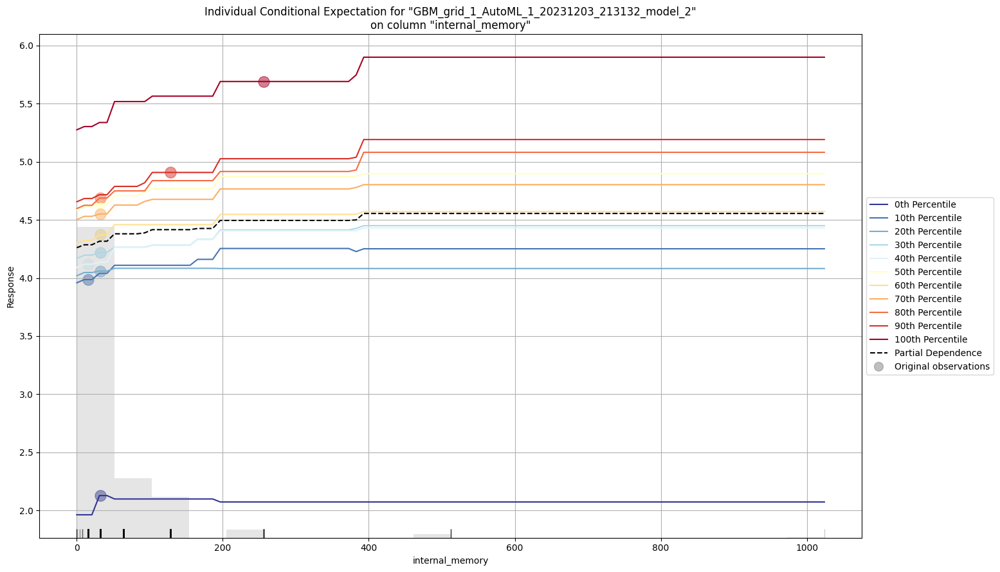

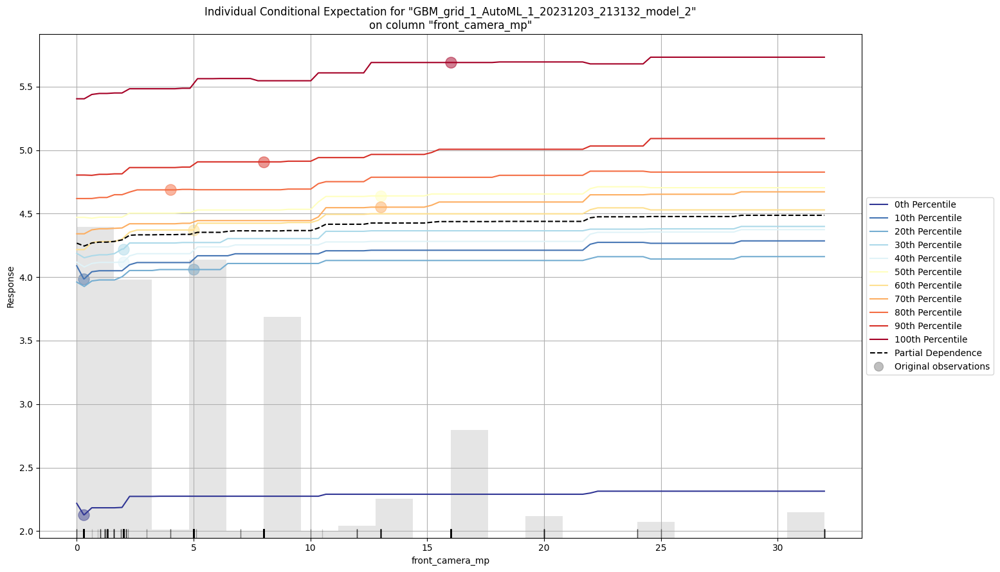

In [46]:
autoML_model.explain(autoML[1])  # AutoML Explainability

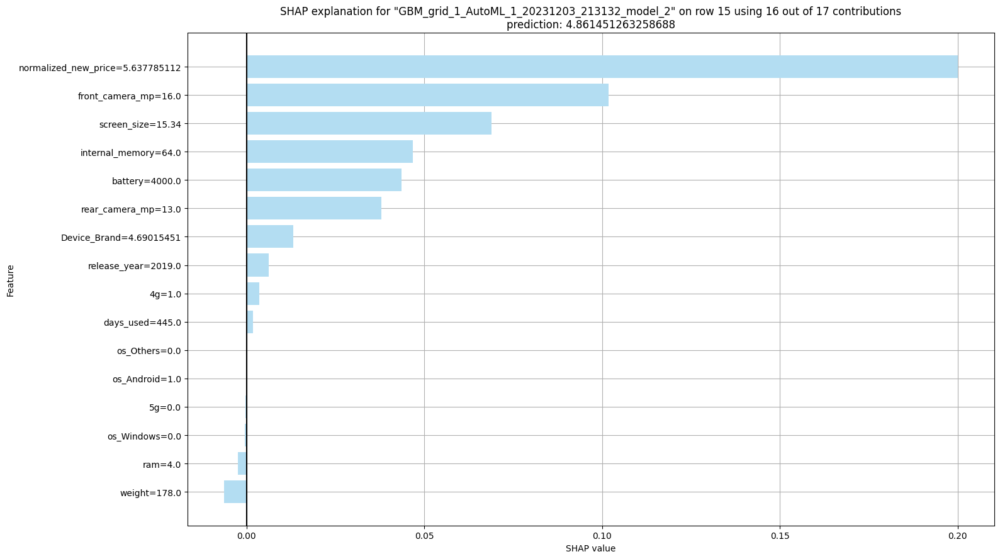

In [48]:
# Lets Analyze the 15th row in Test Data
autoML_model.shap_explain_row_plot(
    autoML[1], 15
)

## **Interpreting Best Model from AutoML**


 **Residual Analysis**
 * A residual analysis scatter plot with most of the points concentrated in the middle and only some points in the edges, along with a horizontal line in the middle, suggests that the regression model is providing a reasonable fit to the data with some exceptions.


* The horizontal line in the middle of the plot represents the mean residual, which should be close to zero if the model is a good fit for the data. The fact that the line is horizontal indicates that there is no systematic bias in the residuals, which is a good sign.

* The majority of the points being concentrated in the middle suggests that the model is accurately capturing the overall trend in the data. However, the presence of outliers or some points in the edges suggests that there may be some data points that are not well explained by the model.

**Variable Importance**
In the variable importance plot we can observe that, the plots also infers the same result we got from Linear Model - normalized_new_price, screen_size, internal_memory, battery are the important variables in predicting the target.The variable importance has been scaled between 0 to 1 for ease of understanding


 **SHAP SUMMARY**
 From the SHAP summary diagram, here are few things we can interpret:

 * normalized_new_price has the most negatoive impact on the normalized_new_price as its values are more towards the left of the 0 SHAPT value and are also more away from the 0 SHAP value towards left.
 * weight, internal_memory seems to be having a more positive impact and screen_size negative impact.

 Overall, a SHAP summary provides valuable insights into how the input features contribute to the output of a machine learning model. It can help to identify important features, understand their direction and strength of the effect, and guide feature selection and model development.


**Partial Dependence Plot (PDP)**
A partial dependence plot (PDP) is a graphical representation of the relationship between a specific feature and the predicted outcome of a machine learning model, while holding all other features constant.

For example, lets analyse normalized_new_price and screen_size plots:
 for normalized_new_price, with increase in normalized_new_price, mean_repsonse is also increasing till it reaches values above ~7.2, beyond which the values dont have any effect on the mean response anymore.

 And for screen_size, and battery,- both of which have kind of similar plots, we can seee that - it is almost a horizontal line parallel to X axis, which means they dont have any effect on the mean_response.

 Overall, a PDP can provide valuable insights into the relationship between a specific feature and the predicted outcome of a machine learning model, while holding all other features constant. It can help to identify important features and guide feature selection and model development - which is again normalized_new_price.


 **ICE (Individual Conditional Expectation) Plot**

An Individual Conditional Expectation (ICE) plot is a type of visualization that shows the predicted outcome of a machine learning model for an individual instance as a function of a specific feature of interest. Here are some general steps to interpret an ICE plot
1.from the plot for normalized_new_price, we can see that, it has a gradually increasing line - meaning with increase in values of normalized_new_price, normalized_used_price is also increasing
2. from the plot for screen_size, battery,internal_memory, rear_camera_mp we can see that, these have almost horizontal lines- meaning - they dont effect the normalized_used_price that much

**SHAP explanation for an Individual used_device_data**

Analyzing the 15th used_device_data in the dataset, we got the predicted_value as 3.135 by using 13 out of 17 contributions, we can see that normalized_new_price is making the highest contribution.

It's important to note that the sum of the feature contributions and the bias term (which is not shown on the plot) is equal to the raw prediction of the model for the specific device, before any inverse link function is applied. This means that you can use this plot to understand which features are driving the predicted outcome for the 15th normalized_used_price and how much they are contributing to it.

Overall, the SHAP summary plot for the 15th used_device_data provides valuable insights into the contribution of each feature to the predicted outcome for that specific device.

# **SHAP Analysis for Linear and Tree-Based Models**

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of normalized_new_price

For the linear model the cross is made at approx E[f(x)] 4.35

For Tree-based model the cross is made at approx E[f(x)] 4.9

So as the normalized_new_price increases the normalized_used_price value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

PermutationExplainer explainer: 2928it [02:38, 18.50it/s]


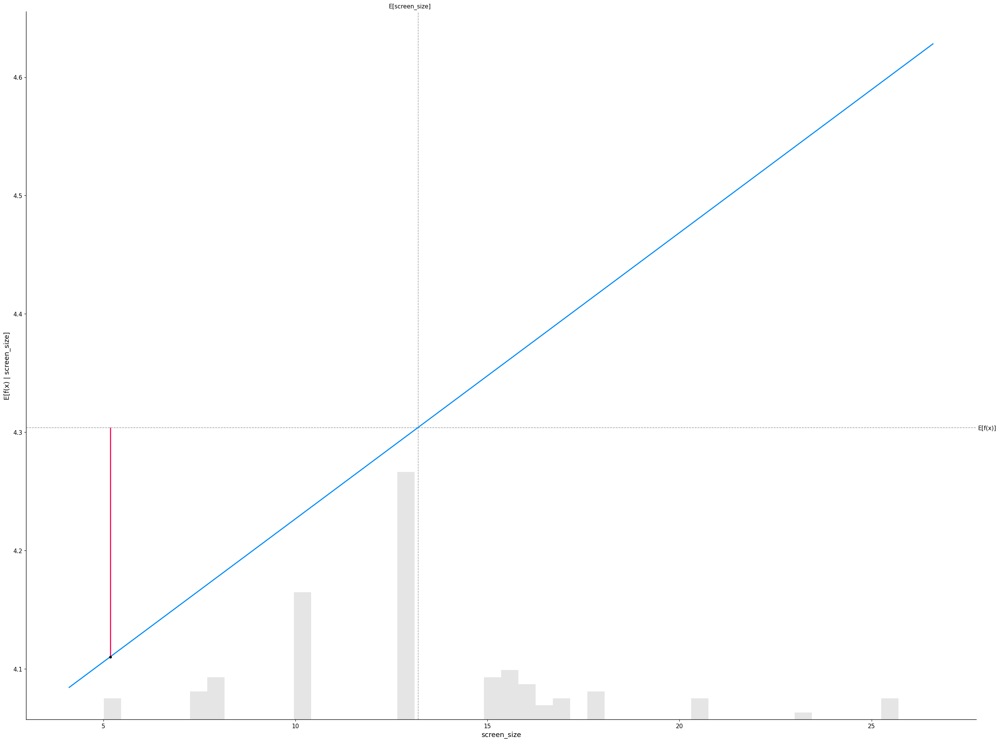

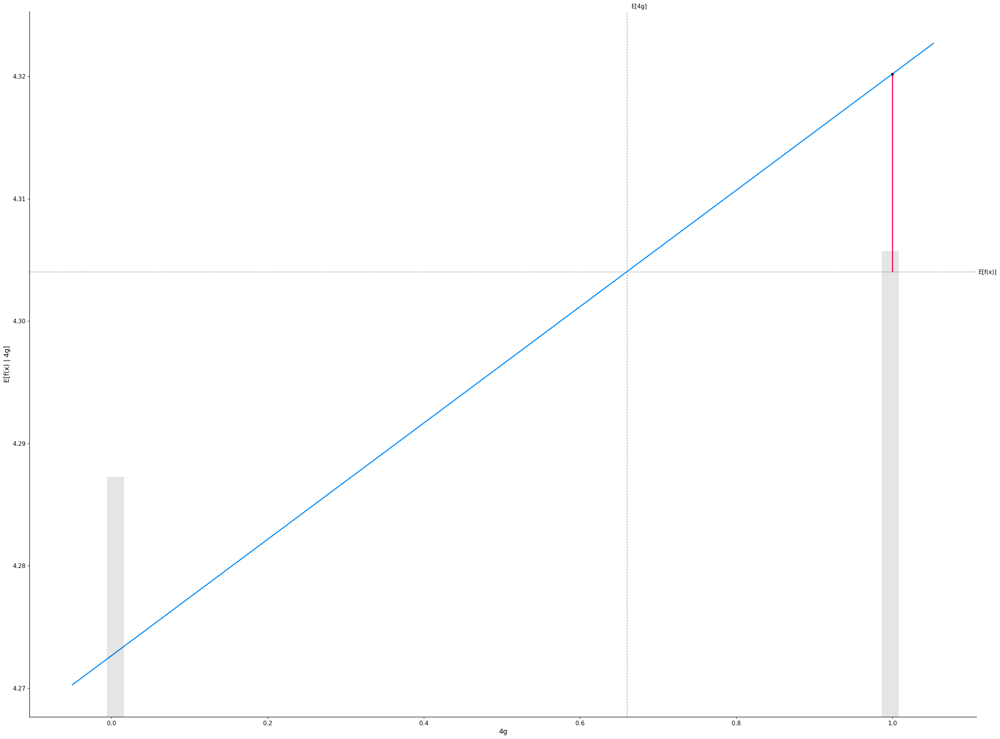

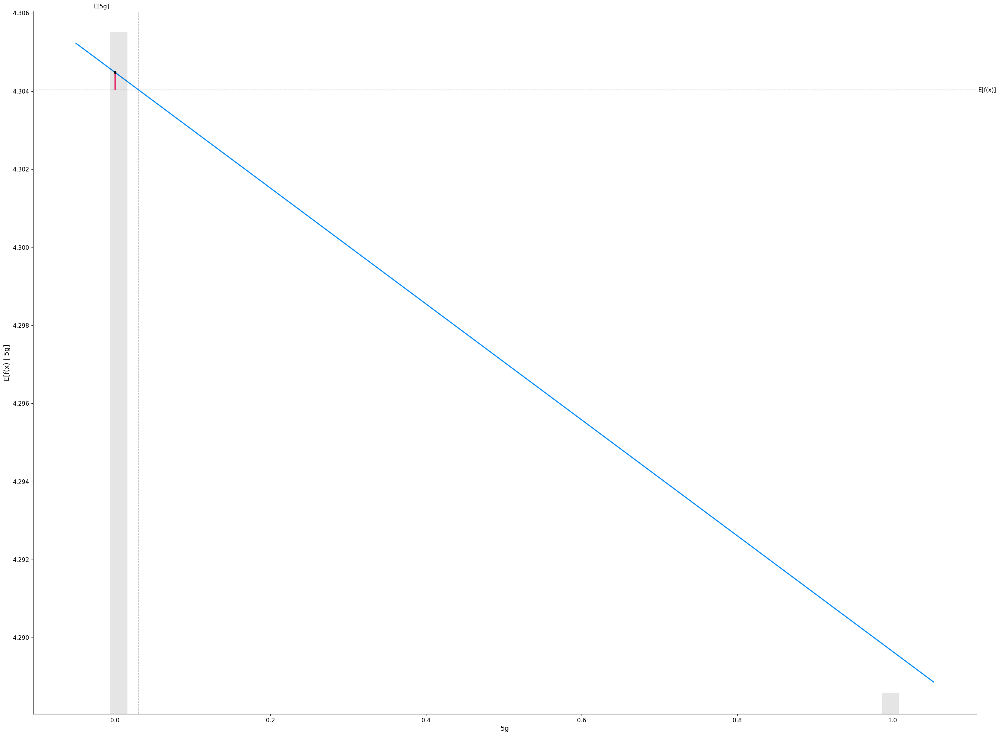

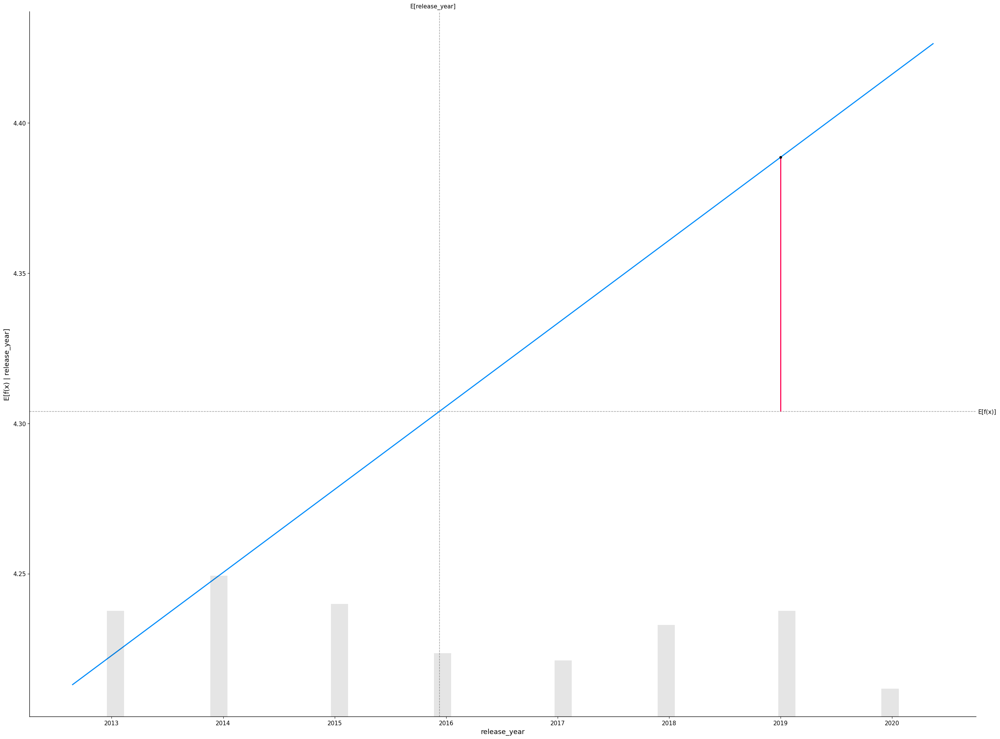

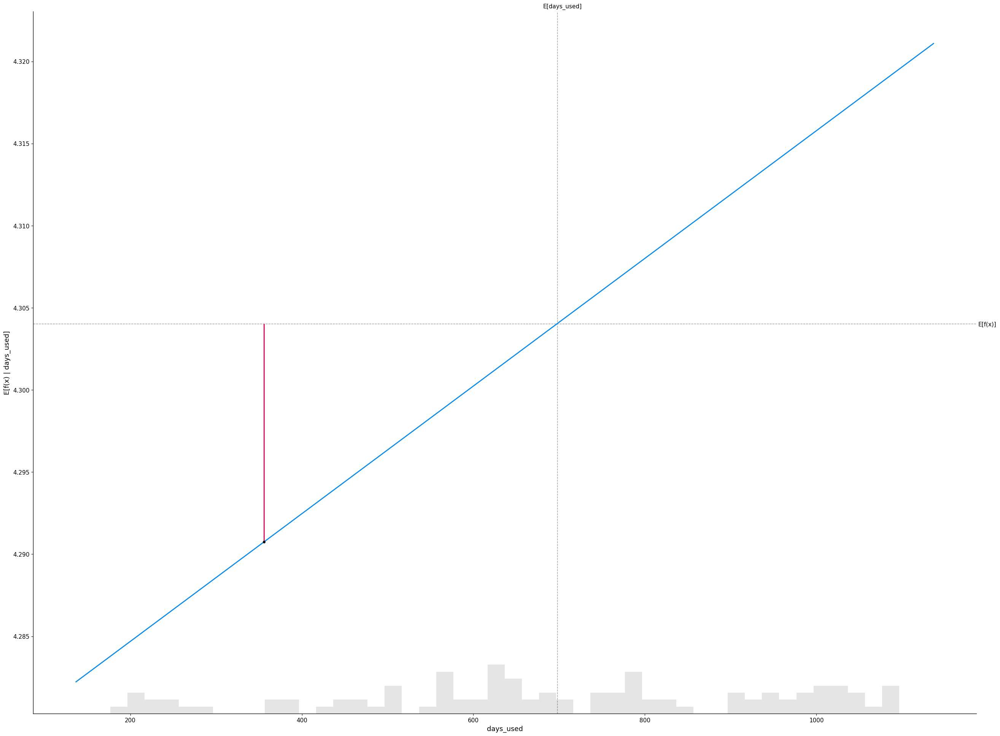

...

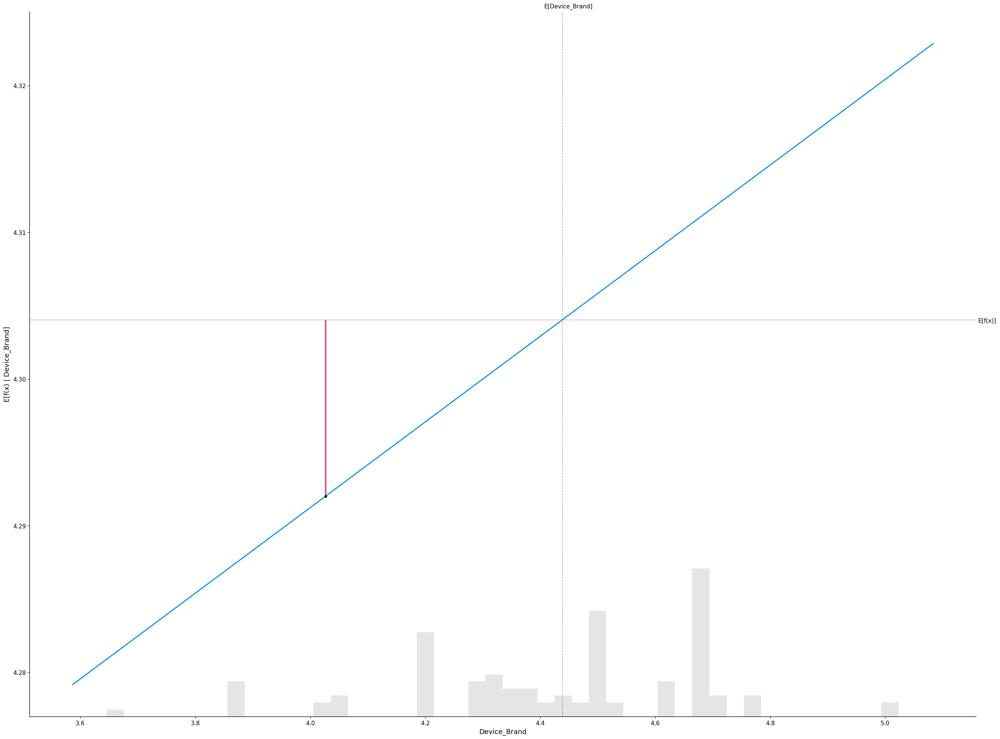

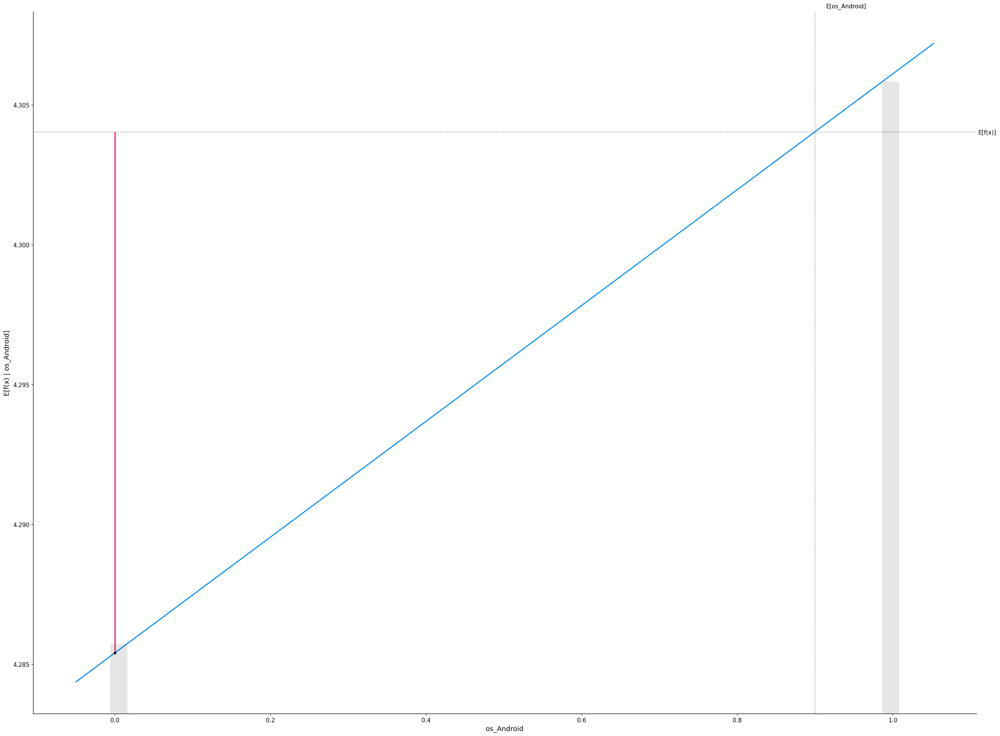

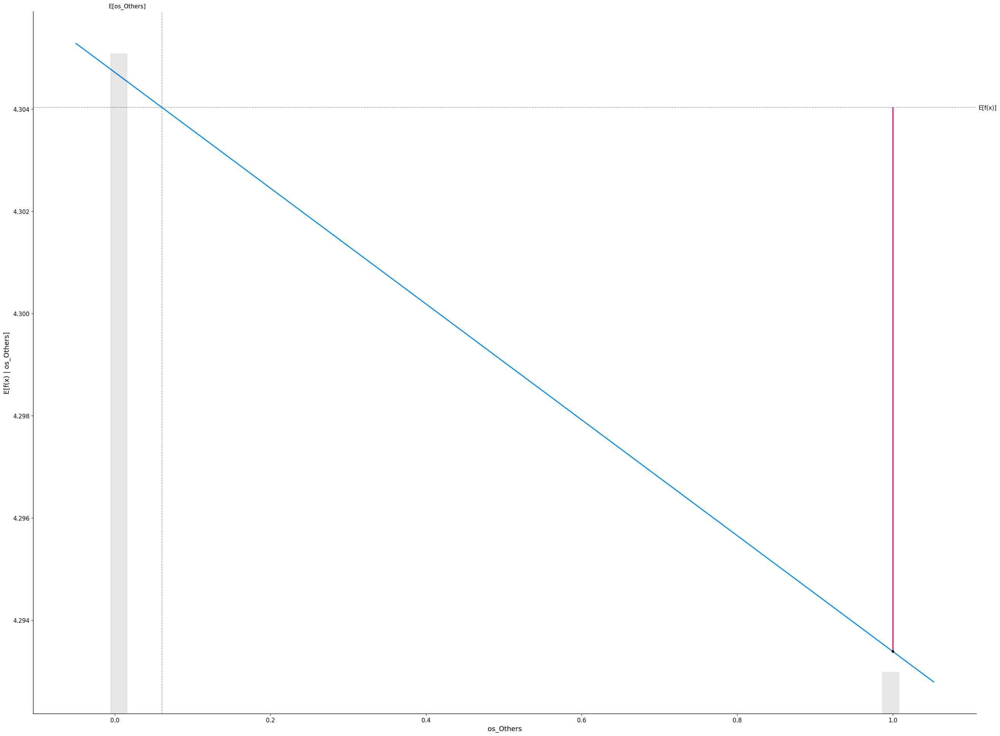

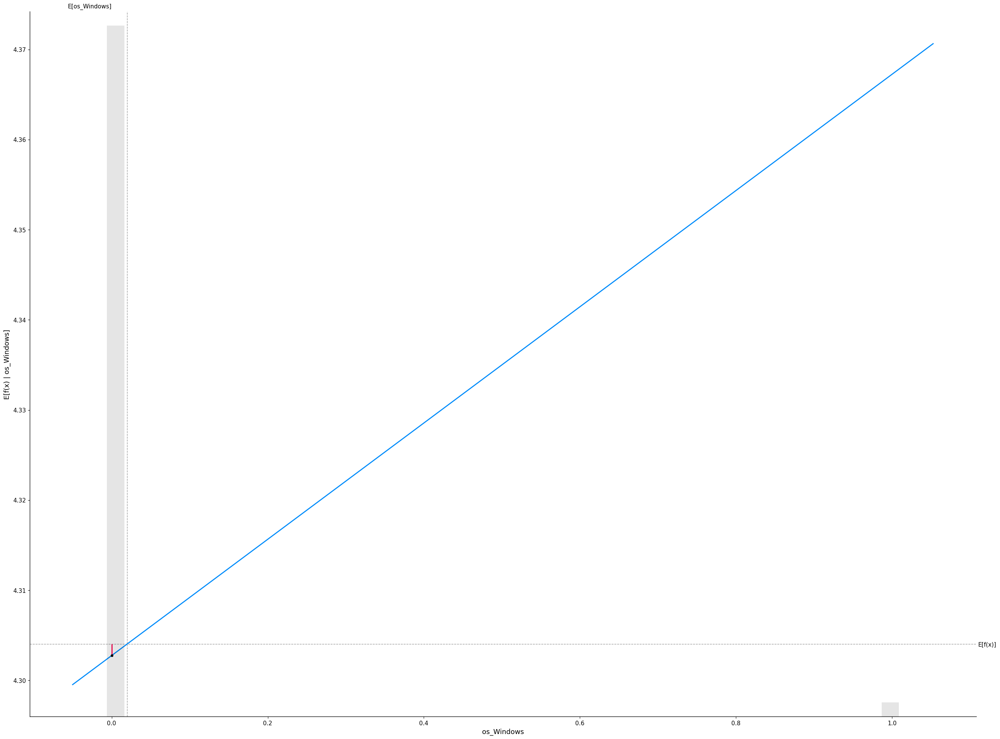

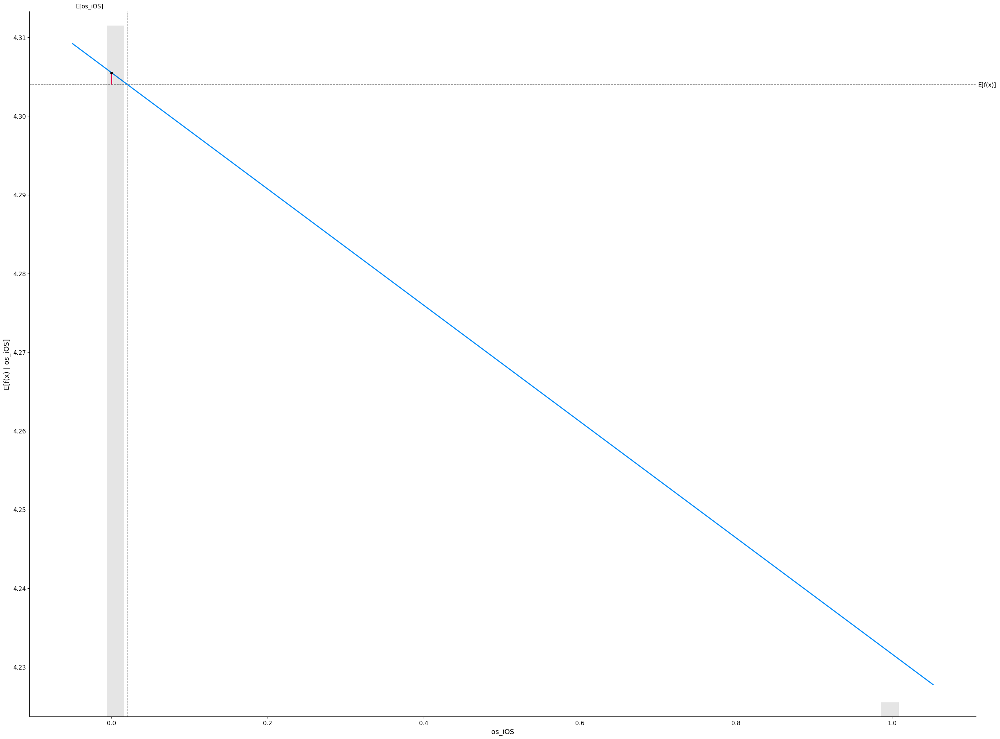

In [49]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

PermutationExplainer explainer: 2928it [02:33, 17.74it/s]                          


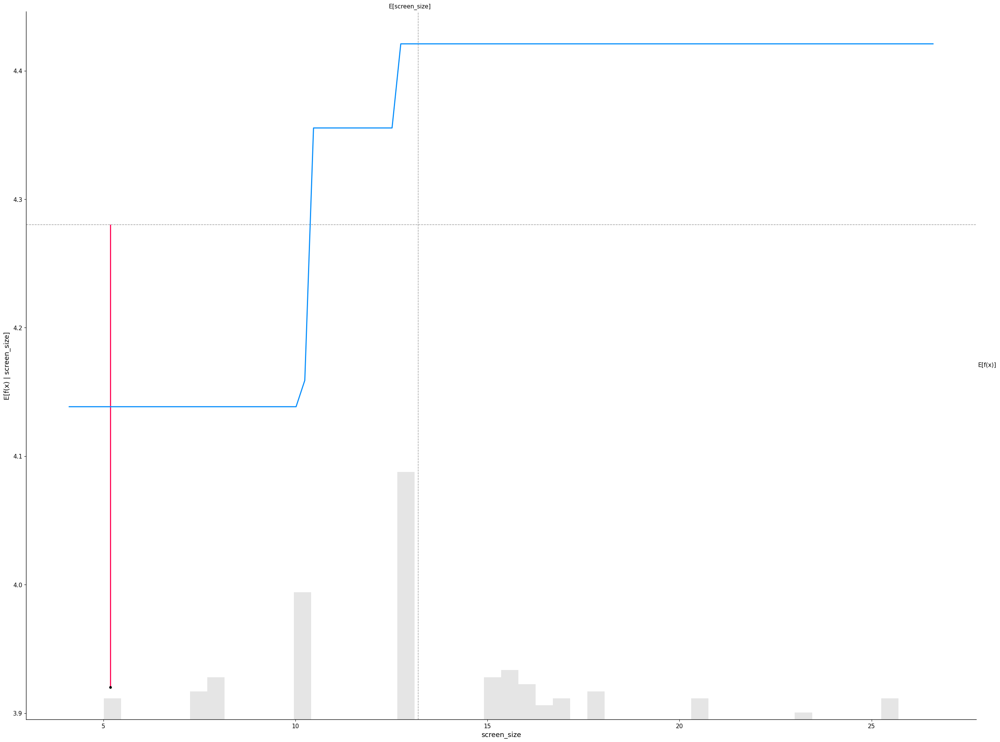

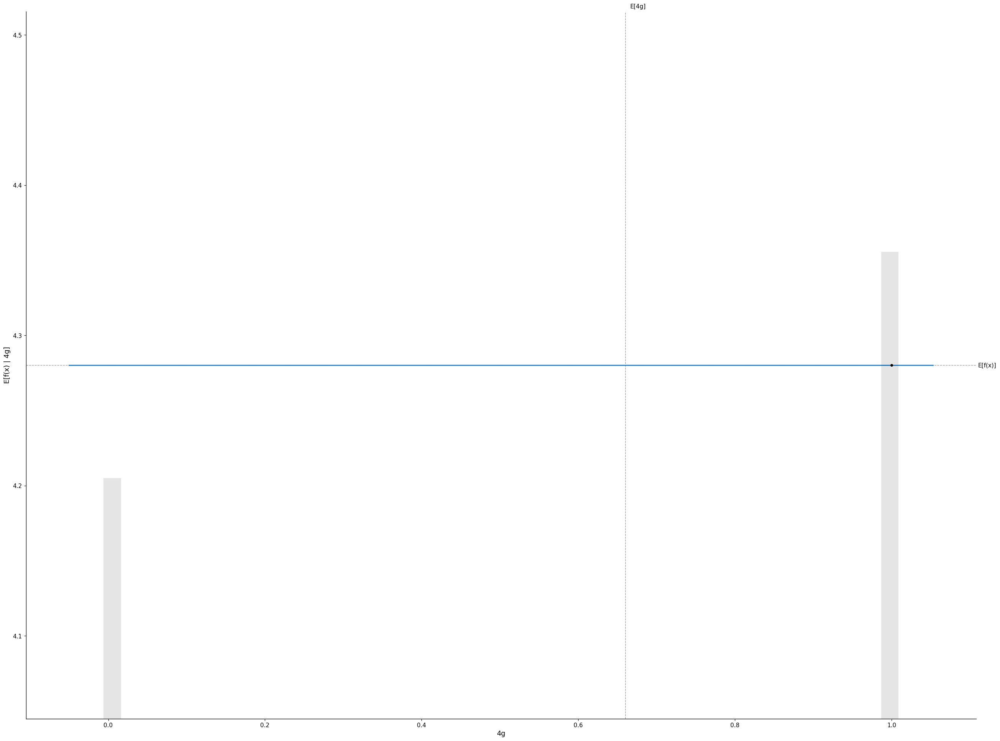

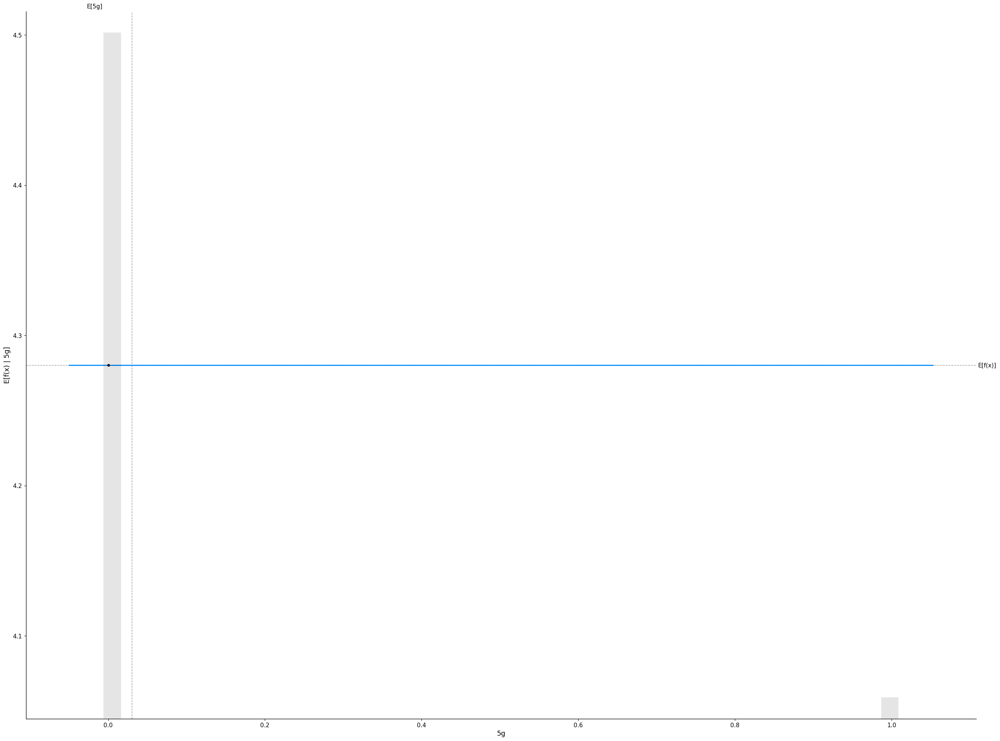

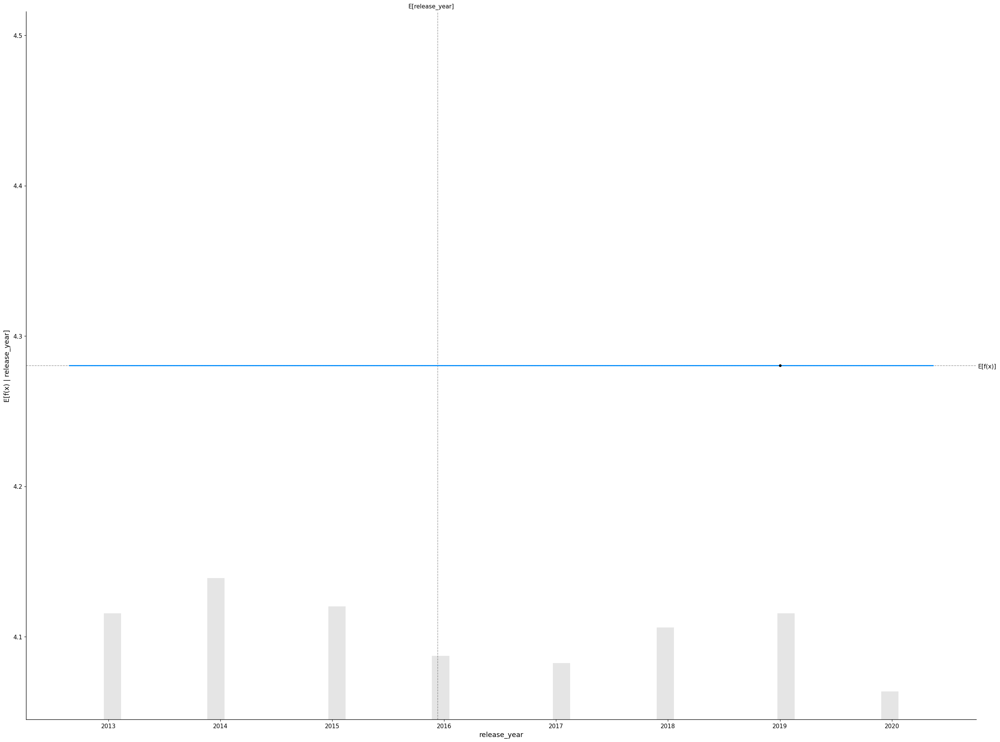

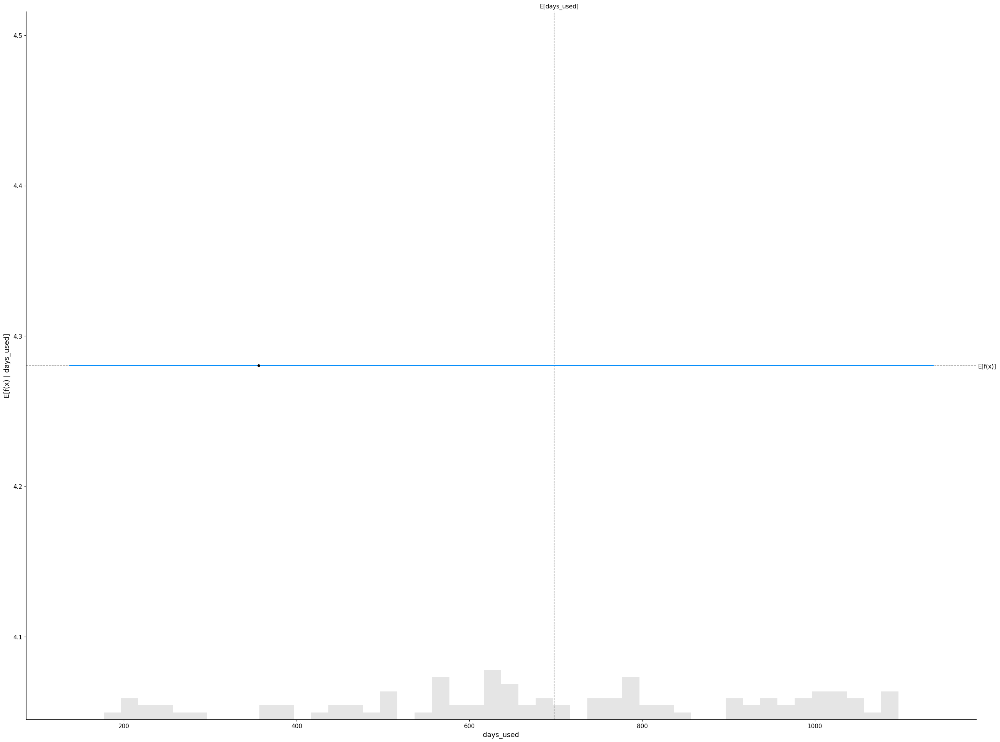

...

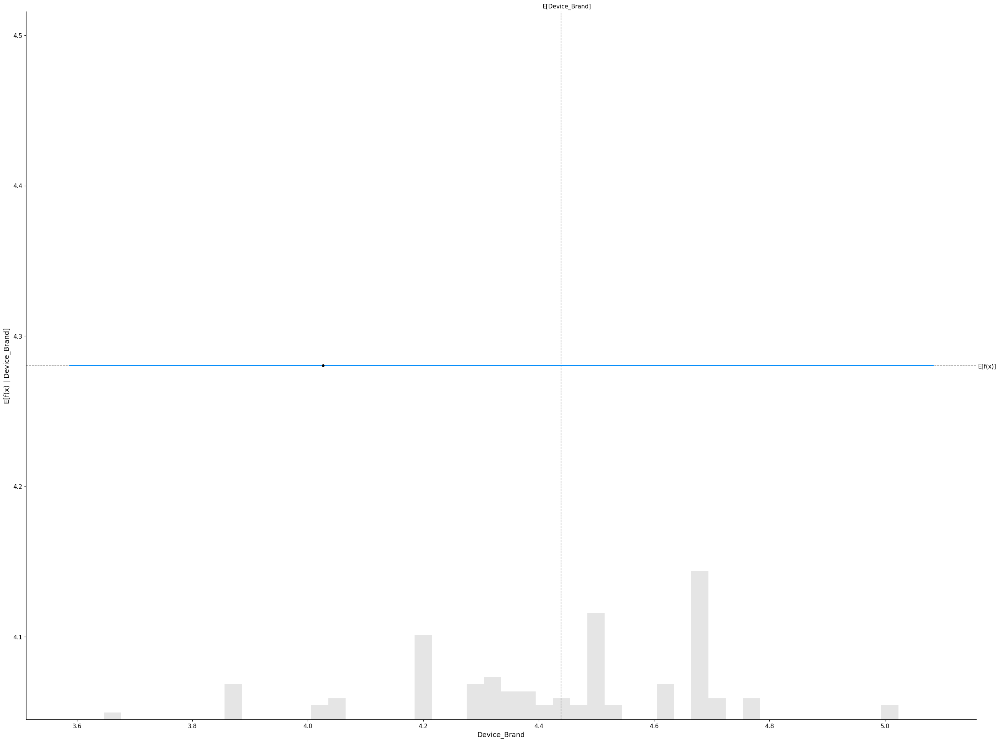

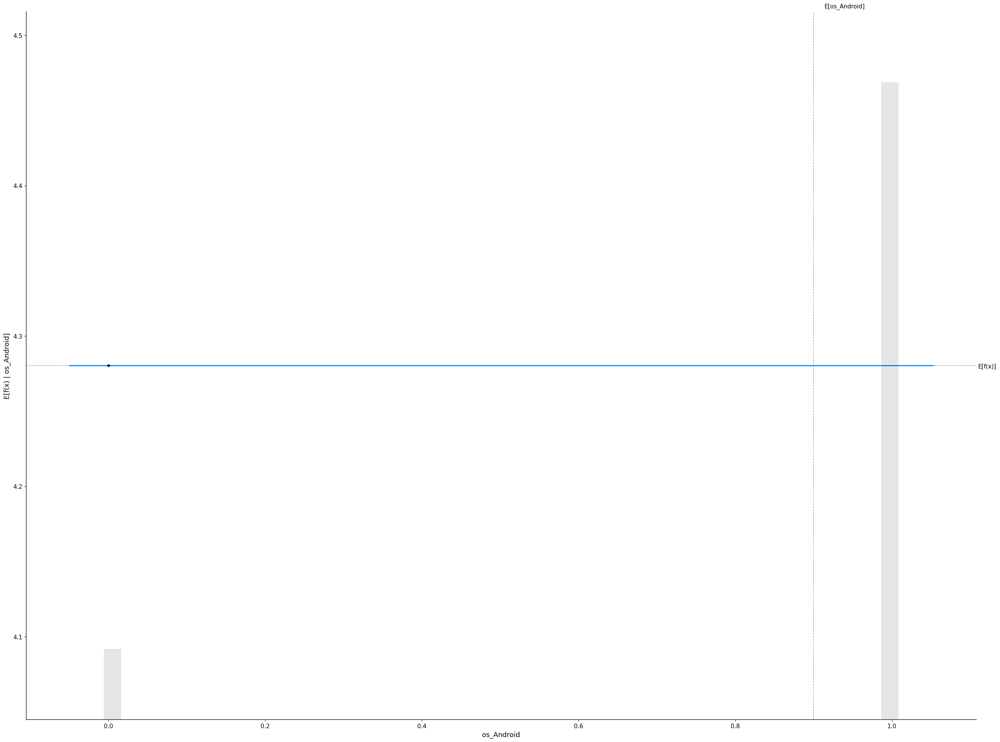

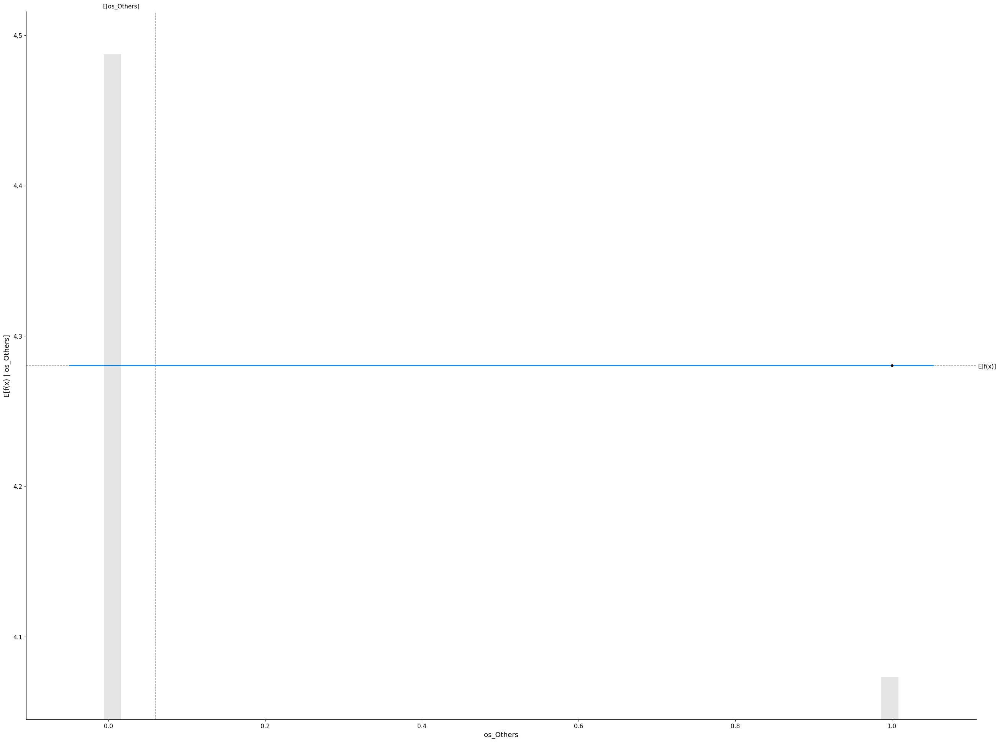

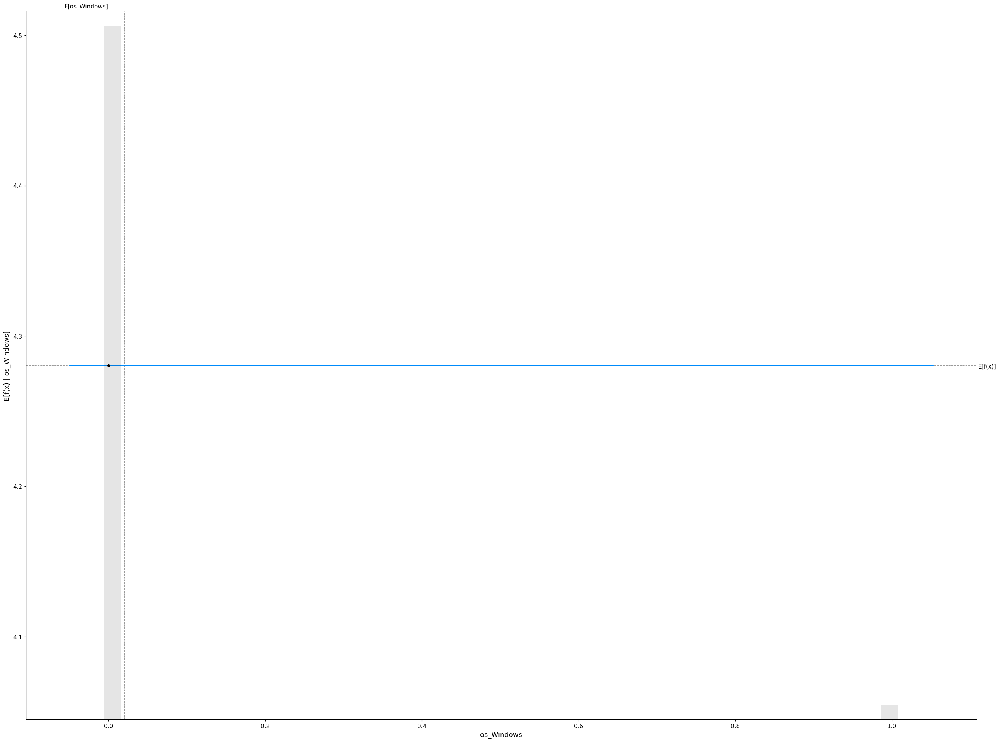

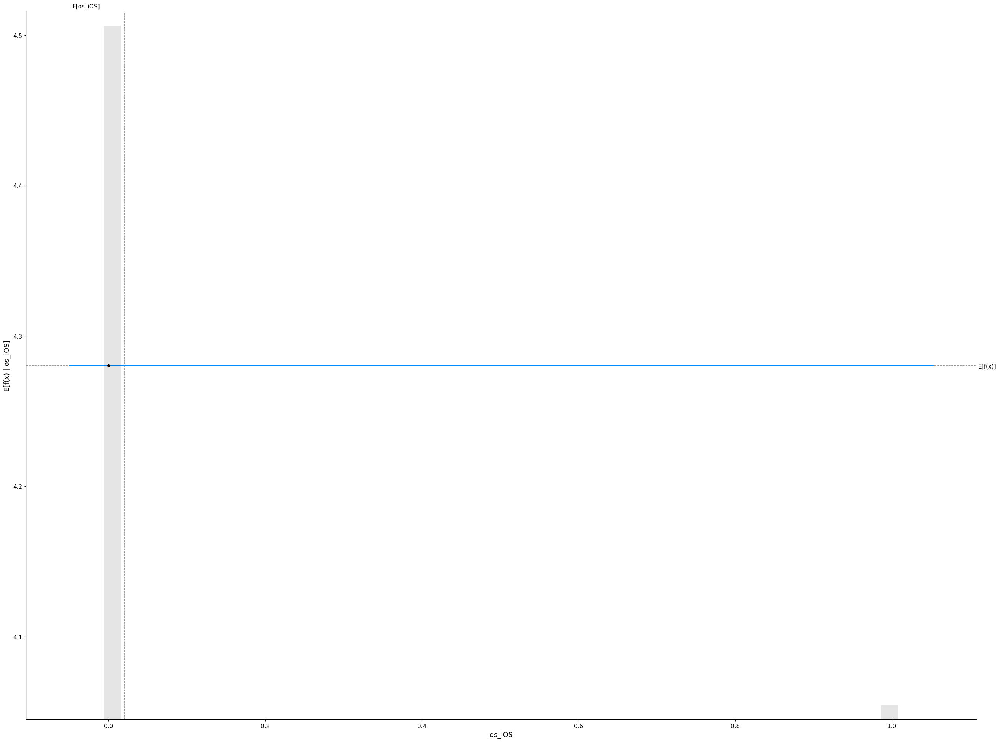

In [50]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

## **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a linear model SHAP feature importance for tree-based model As we can see below in the plots, there is a difference in feature importance for both the models

For the linear model, rear_camera_mp, screen_size, front_camera_mp, weight are the next most important features in order but for our tree-based model screen_size, internal_memory, is the second most important feature when we consider the average of SHAP values to calculate feature importance.

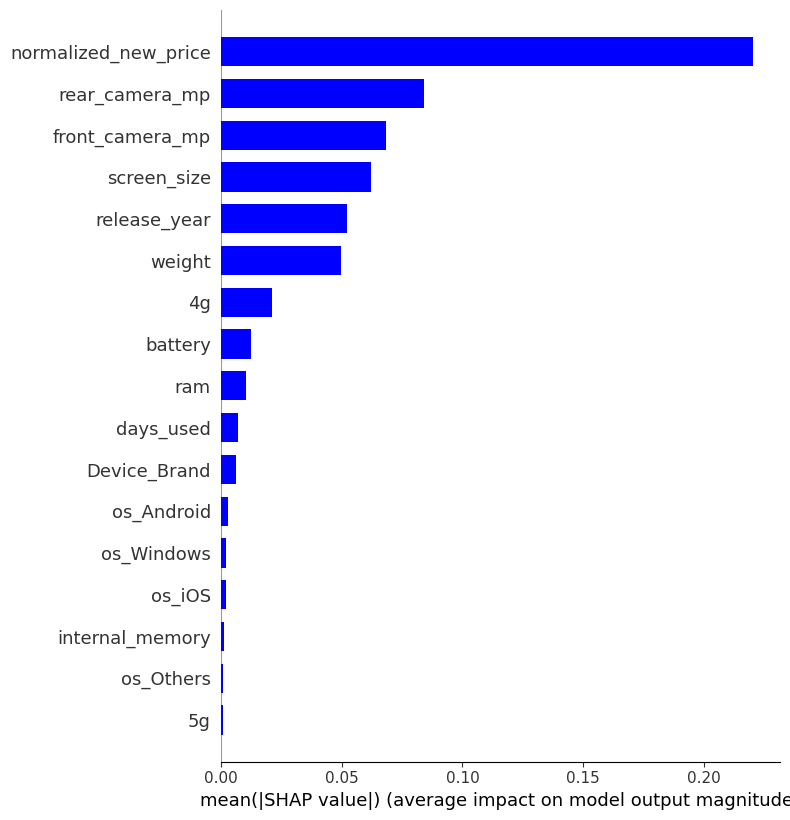

In [51]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

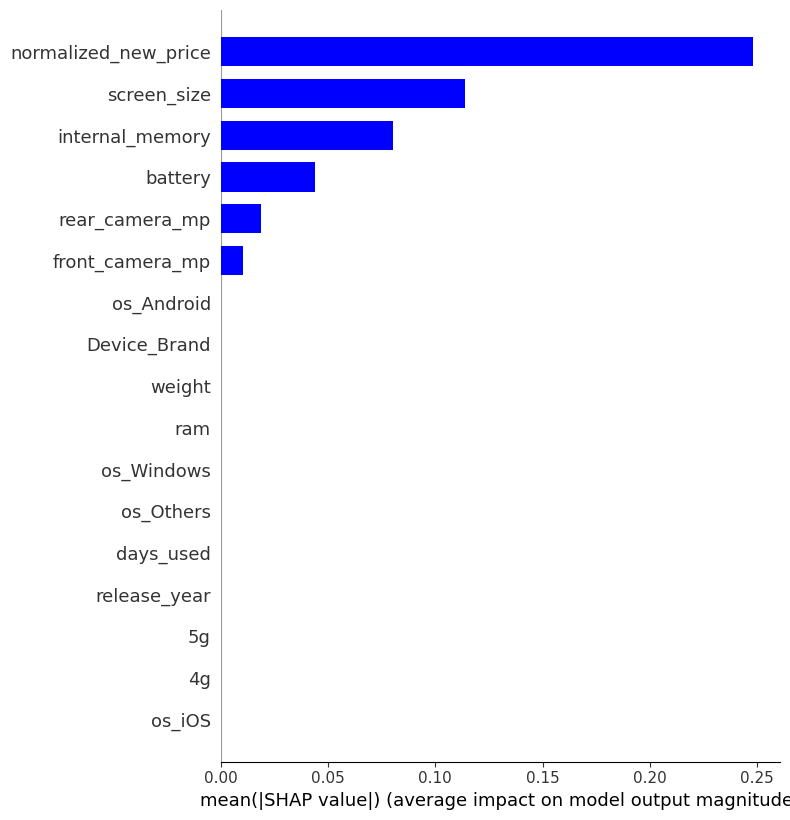

In [52]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

## **Interpreting Waterfall SHAP visualization**

Let's consider the same sample (sample_ind = 18)

For the linear model, the prediction for the instance with index 18 is 3.305. This means that the linear model predicts an output of 3.305 for this instance based on its input features. The expected output for this instance based on the distribution of the dataset is 4.357. This means that, on average, the output for instances similar to this one is expected to be 4.357.

For the tree-based model, the prediction for the instance with index 18 is 3.076. This means that the tree-based model predicts an output of 3.076 for this instance based on its input features. The expected output for this instance based on the distribution of the dataset is 4.362. This means that, on average, the output for instances similar to this one is expected to be 4.362.

The difference is kind of large, it may indicate that the model is struggling to capture the underlying patterns in the data for this instance.

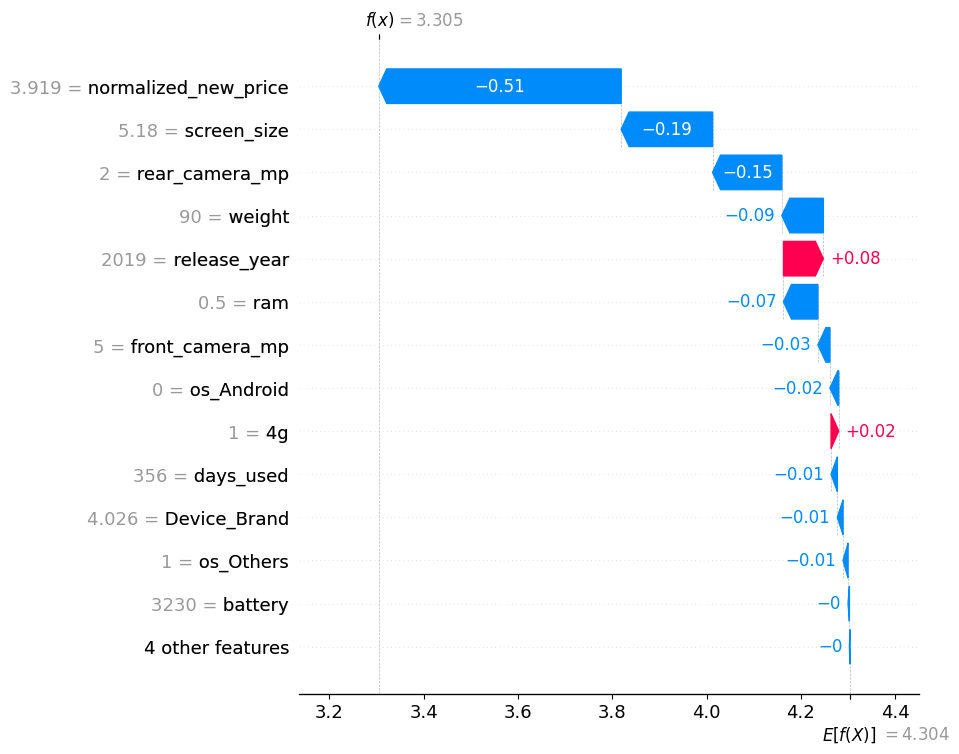

In [53]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

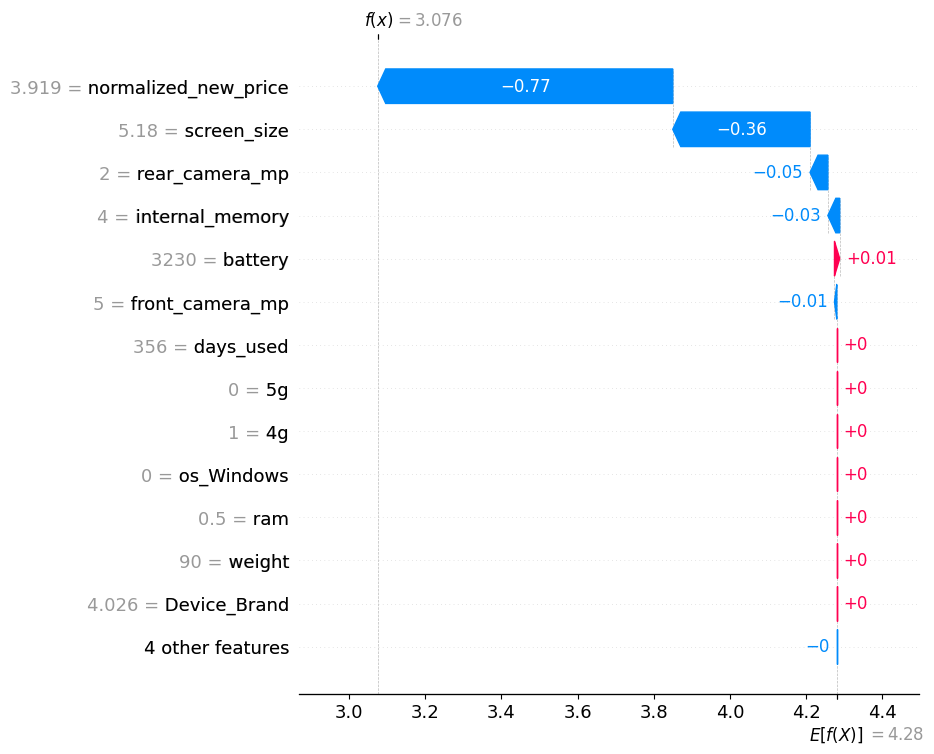

In [54]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

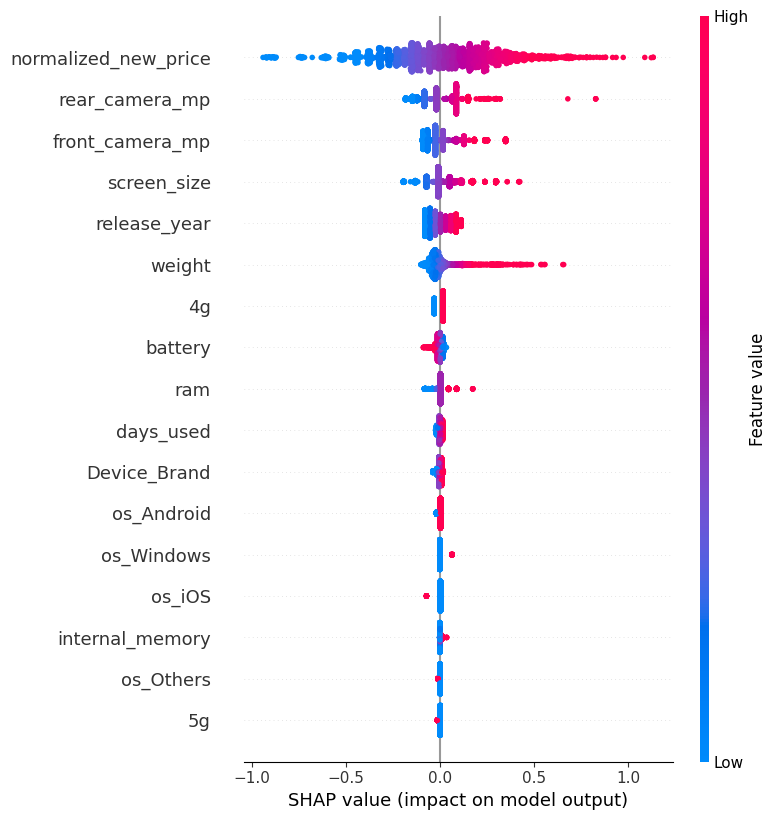

In [55]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

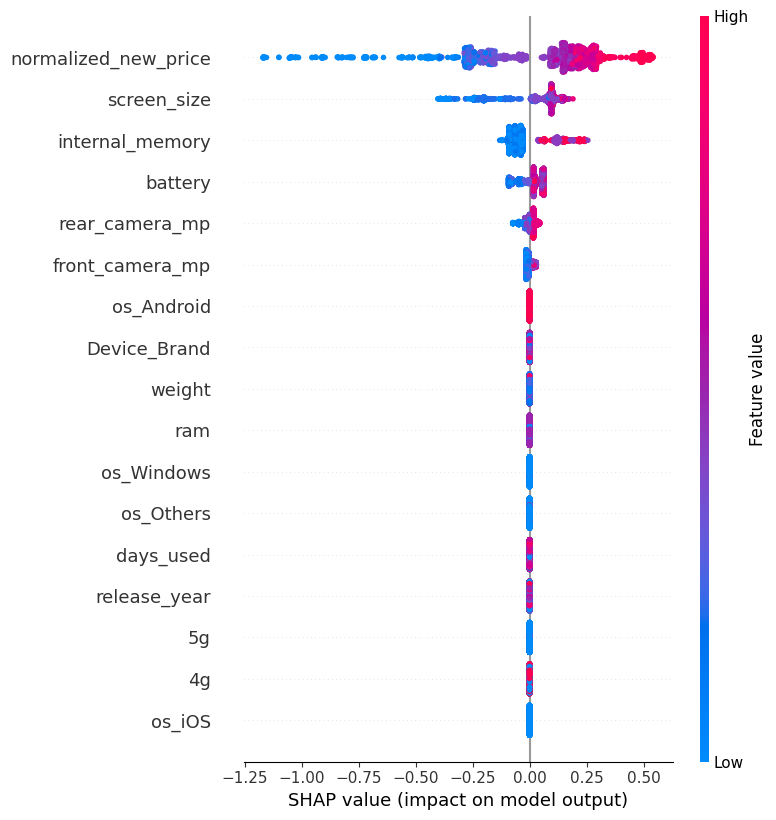

In [56]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

## **Interpreting SHAP dependence plot for Linear and Tree-based model**
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every device in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the normalized_used_price then the relationship will be directly proportional e.g. normalized_new_price and screen_size, etc and if the feature harms normalized_used the relationship will be inversely proportional.

For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.

Example of SHAP dependence plot of normalized_used_price

In the linear model the relationship is linear between normalized_used_price and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly proportional.

But it is not like that with treebased model.

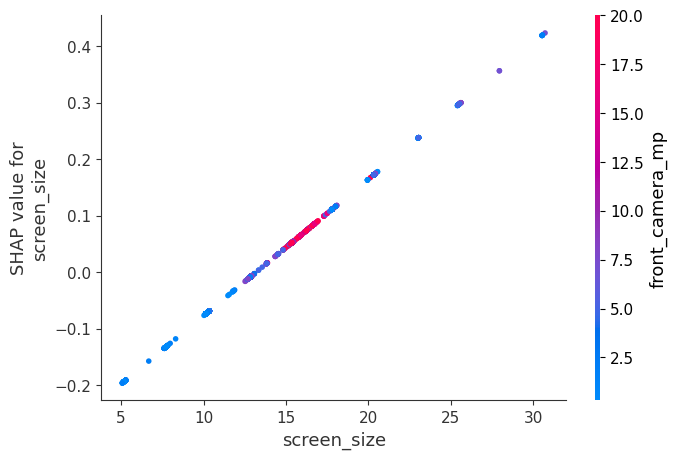

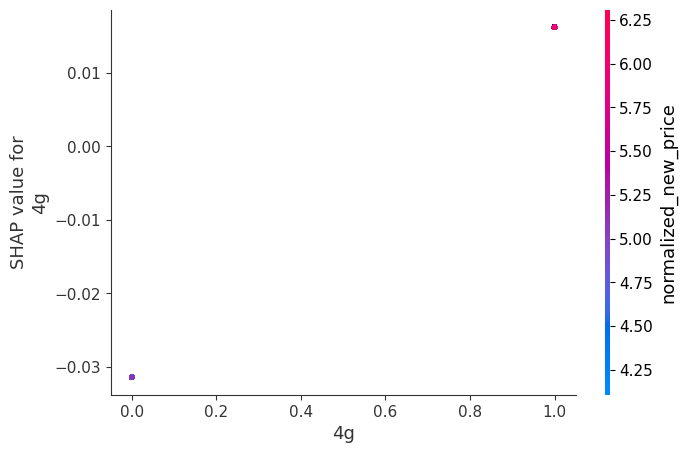

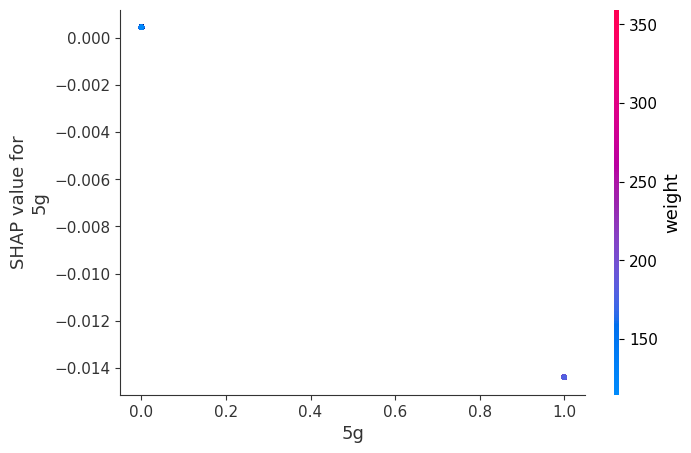

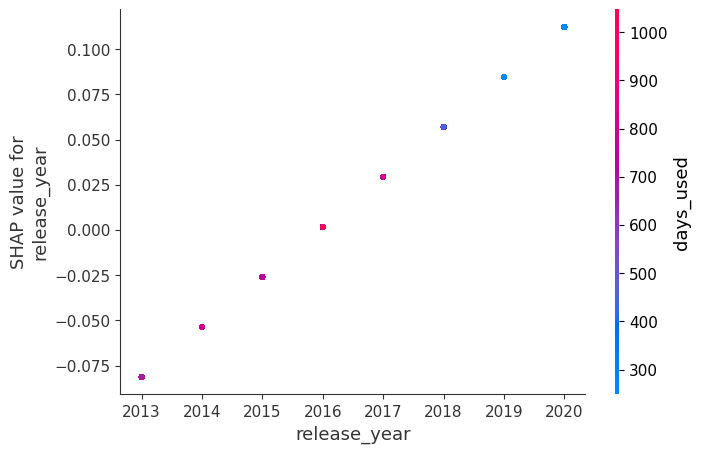

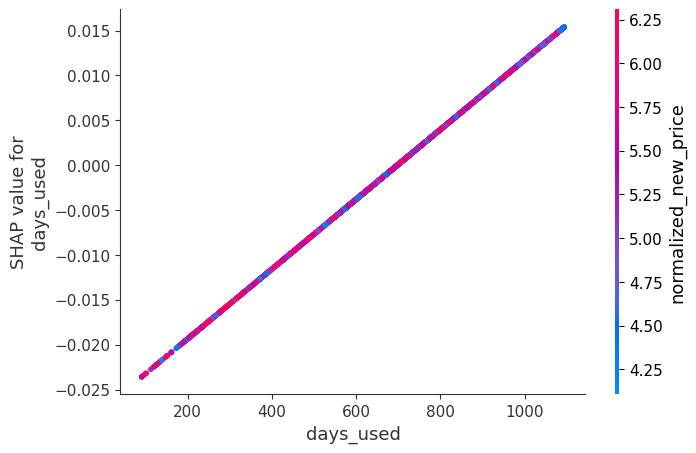

...

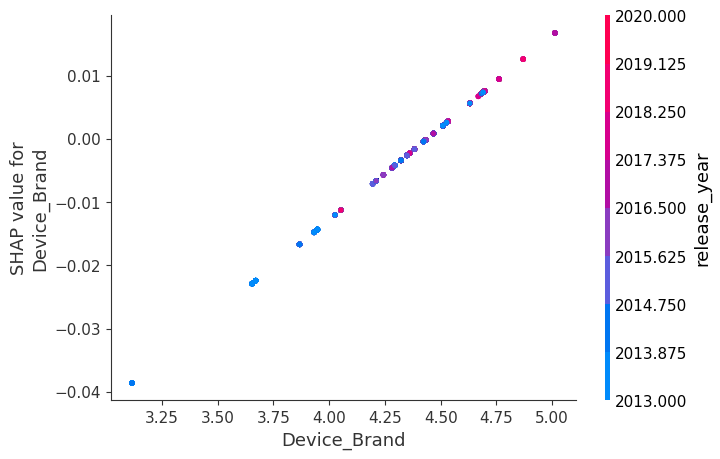

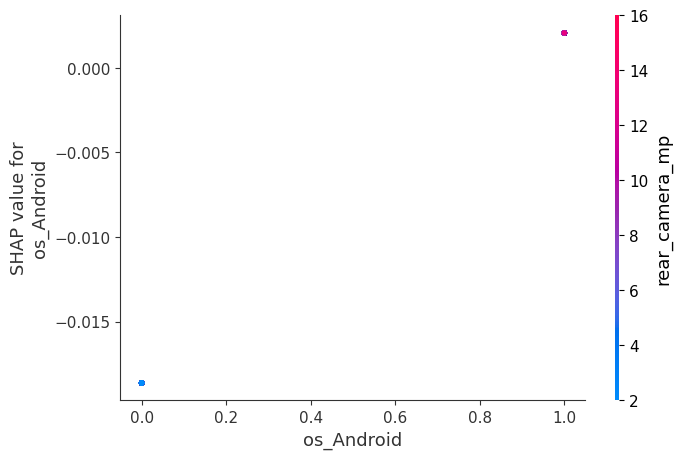

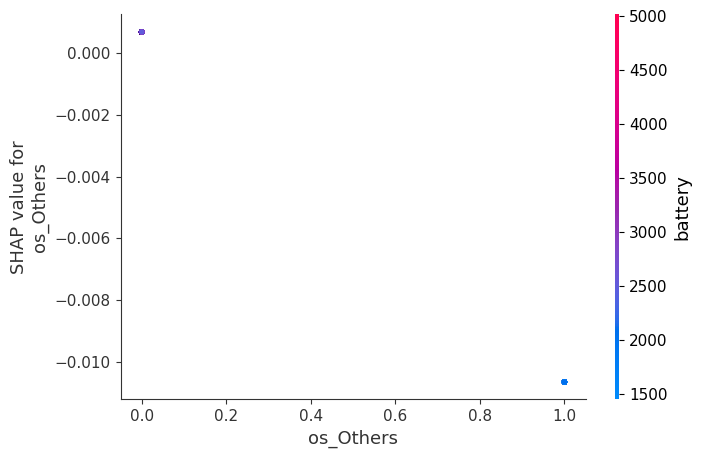

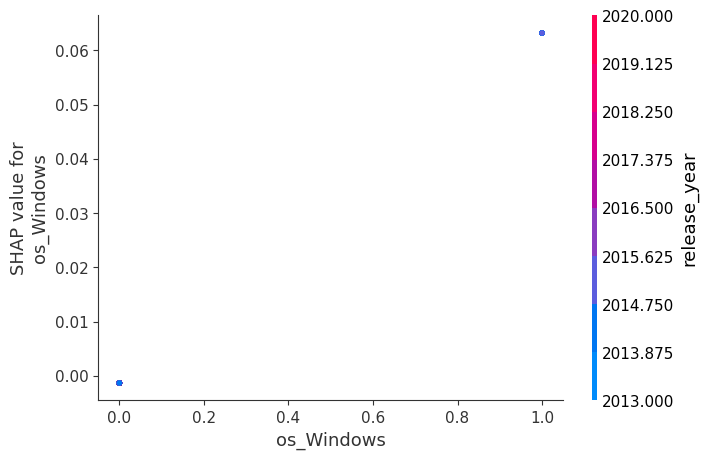

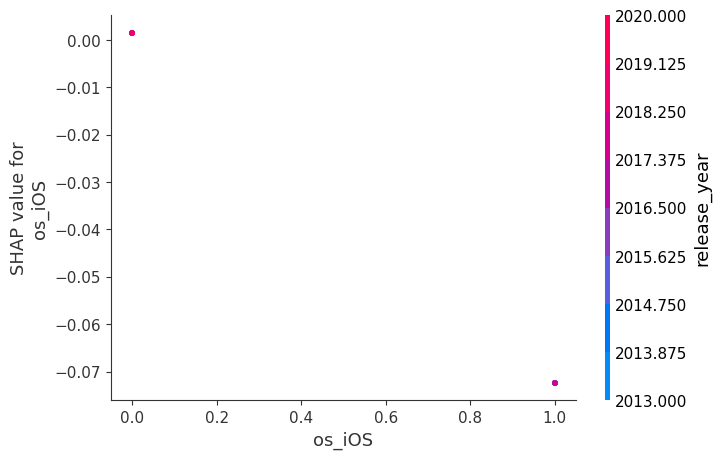

In [57]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

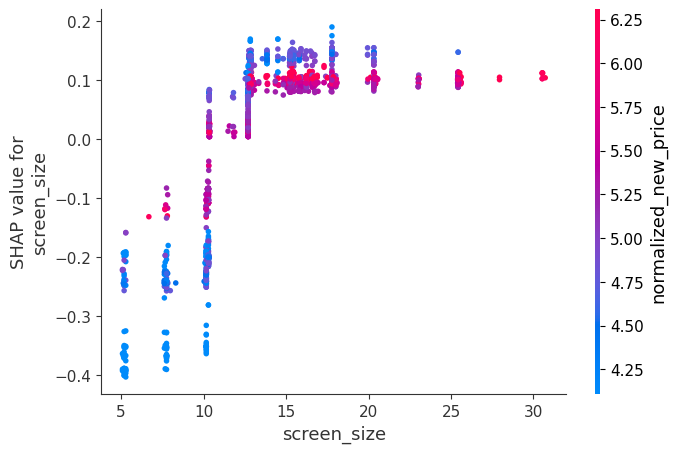

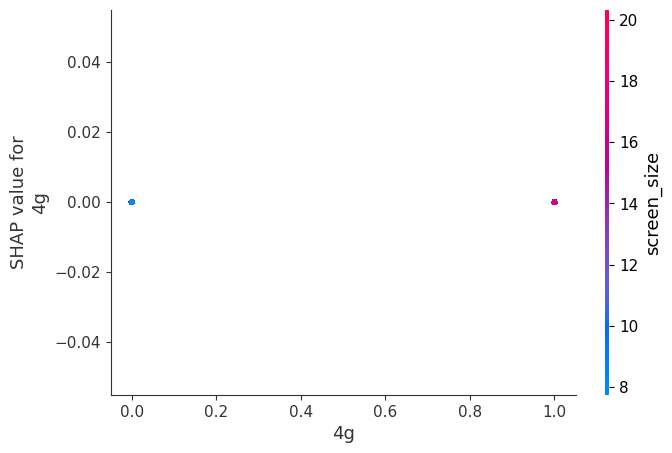

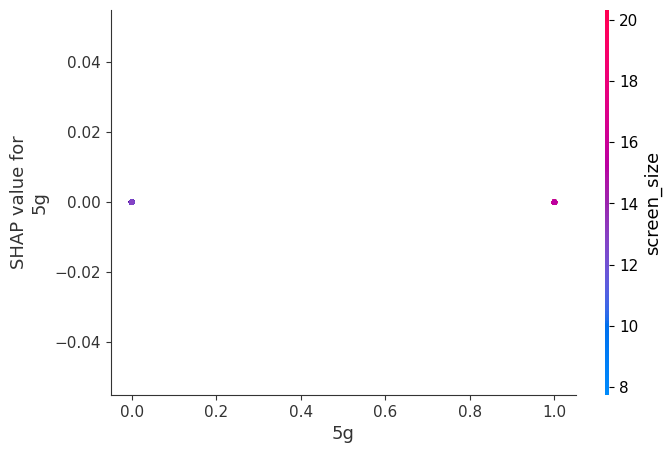

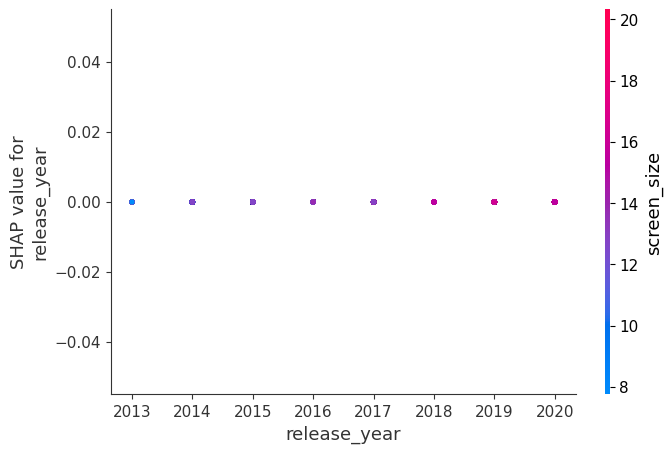

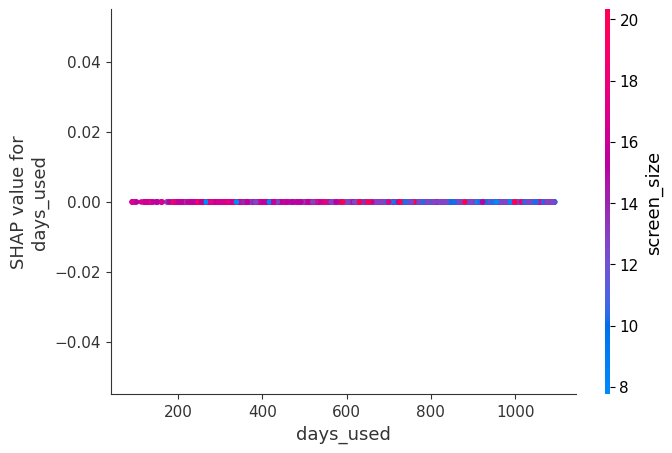

...

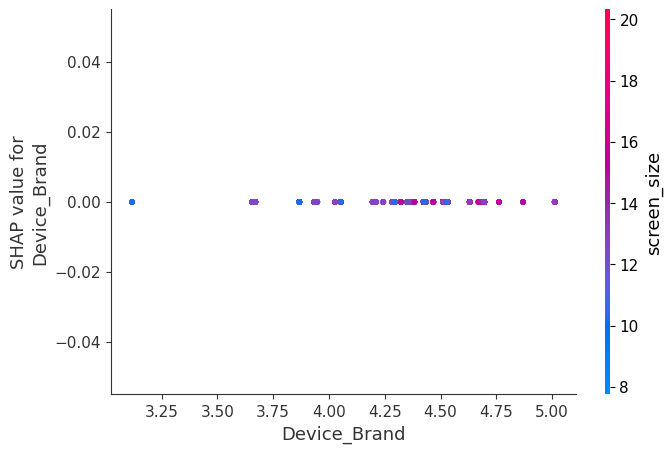

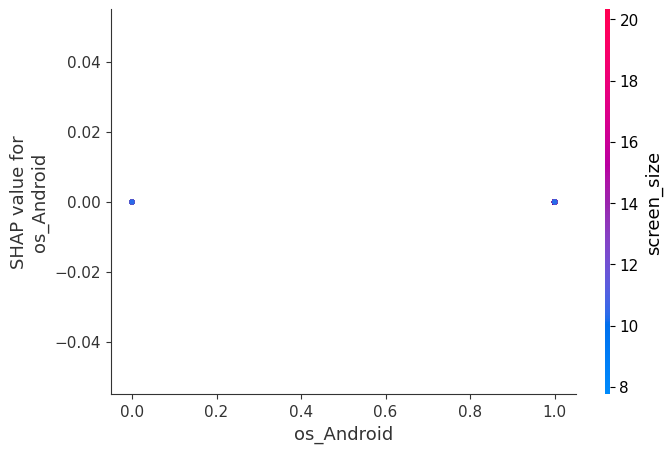

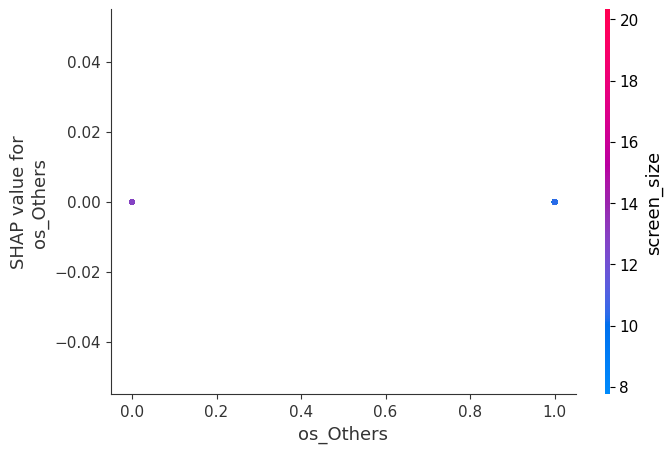

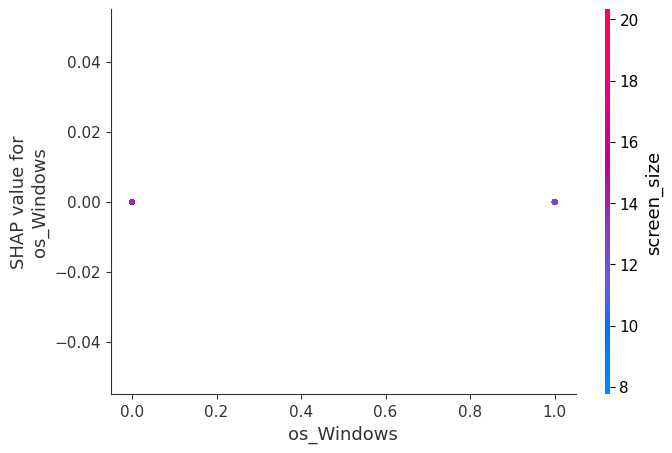

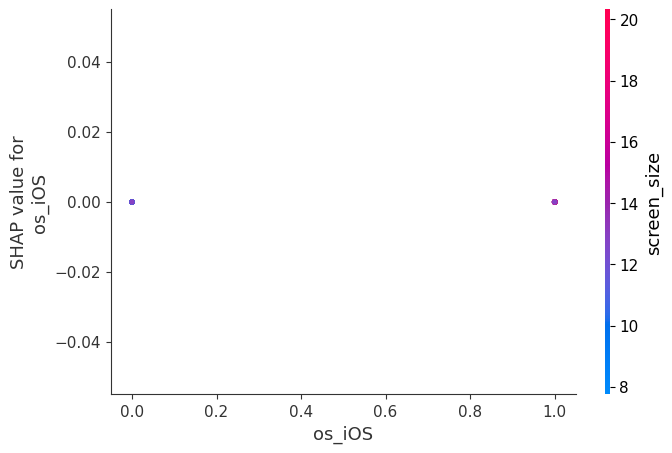

In [58]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [59]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [60]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

**Force Plot SHAP analysis**
Force plot is a visualization tool used in SHAP analysis to understand how each feature contributes to the prediction of an individual instance in a machine learning model. It is a detailed and interactive visualization that helps us to interpret the SHAP values of each feature for a given instance.

It helps to explain the prediction of a model by showing the contribution of each feature to the final prediction. This helps to understand how the model is making decisions and which features are most important.

It allows us to explore the relationship between the feature values and the predicted output for a specific instance. This can help to identify instances where the model may be making incorrect predictions and identify opportunities to improve the model.

It provides a visual representation of the SHAP values for each feature in the form of a bar chart. This makes it easy to identify which features are positively or negatively impacting the prediction and the magnitude of their impact.

It allows us to interact with the plot and see how the predicted output changes as they change the values of individual features.

In [61]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(18))  # SHAP force plot for sample 18

## **Heatmap Visualization for Linear and Tree-based model**
This visualization provides a summary of the relationship between each feature and the target variable (normalized_used_price) for the entire dataset. It shows the impact of each data point within a feature on the target variable.

The Y-axis represents the features, while the X-axis represents the instances of that feature. Each instance is colored either blue or red to indicate whether it had a negative or positive effect on the target variable. The intensity of the color is directly proportional to the magnitude of the effect, with deeper colors indicating stronger effects.

Overall, this visualization enables a quick and easy understanding of the impact of individual data points within each feature on the target variable. It helps to identify which features have the greatest impact on the target variable and provides insights into the relationships between the features and the target variable.

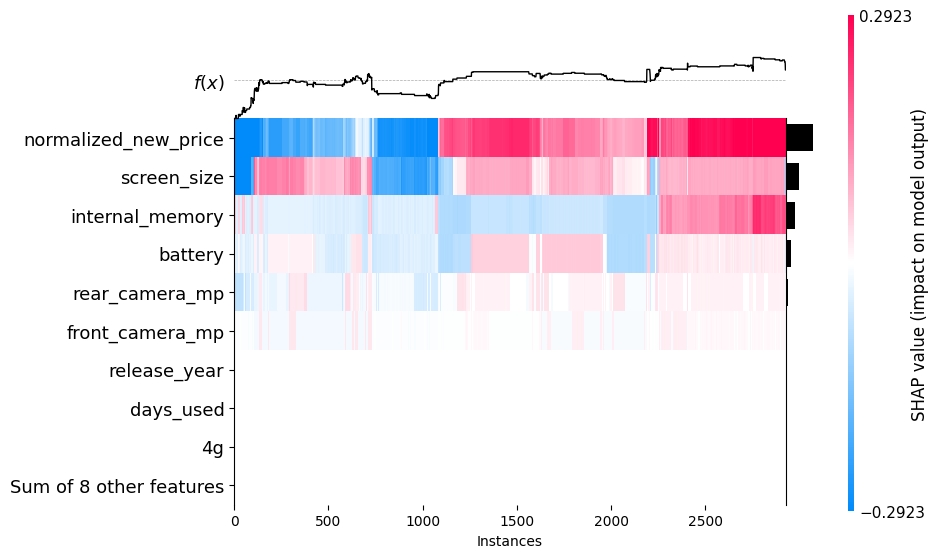

In [62]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

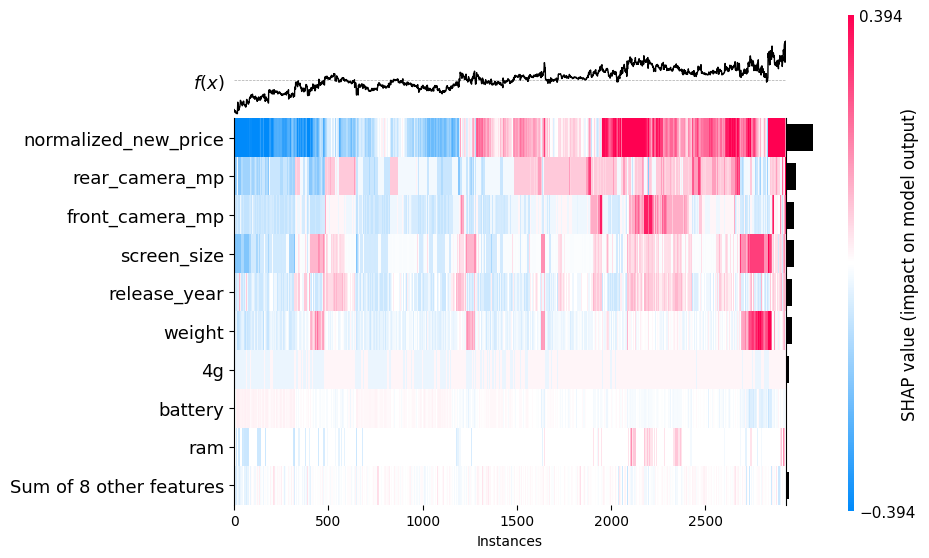

In [63]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

 **LIME (Local Interpretation Model-Agnostic Explanation) Analysis** LIME (Local Interpretable Model-Agnostic Explanations) is an explainability technique in machine learning that helps to understand the predictions of a model at a local level. It is a model-agnostic method, meaning it can be used with any machine learning model, regardless of the type of model or the algorithm used for training.

LIME analysis works by generating local explanations for individual predictions of a model. It identifies the most important features that contributed to a particular prediction and provides insights into how these features affected the model's output.

Here's how LIME analysis works:

Select the instance for which you want to explain the model's prediction.

Generate a dataset of perturbed instances by randomly sampling from the original dataset and modifying the feature values for the selected instance.

Generate predictions for the perturbed instances using the original model.

Train an interpretable model, such as a linear model or decision tree, on the perturbed instances and their corresponding predicted outputs.

Compute the feature importance scores for the selected instance based on the coefficients or feature importances of the interpretable model.

Use the feature importance scores to generate a local explanation of the selected instance's prediction.

LIME analysis is useful because it provides interpretable and easy-to-understand explanations for individual predictions of a machine learning model. This can be helpful in scenarios where understanding the reasoning behind a model's prediction is important, such as in healthcare, finance, or legal domains.

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative.

Here for this sample as seen below normalized_new_price, rear_Camera_mp, os, 4g, 5g have positive effect on both the models.

days_used and weight have positive effect only in tree based model.

The rest of the features have negative effect in both the models.

These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

# **Linear Model**

In [64]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [65]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [4.52533329]
Actual :      4.259293869


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In [66]:
# Display Results in Notebook
lime_linear_explanation.show_in_notebook()

# **Tree Based Model**

In [67]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [68]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [4.51713122]
Actual :      4.259293869


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names


In [69]:
# Display Results in Notebook
lime_tree_explanation.show_in_notebook()

# **Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**
SHAP (SHapley Additive exPlanations), LIME (Local Interpretable Model-Agnostic Explanations), and Partial Dependence Plot (PDP) analysis are three popular techniques used for explaining the predictions of machine learning models. While they all aim to provide interpretability, they differ in their approach and the insights they offer.

Here's a comparison between the three techniques:

SHAP: SHAP is a model-agnostic technique that provides a unified framework for explaining the output of any machine learning model. It calculates the contribution of each feature to a specific prediction by considering all possible feature combinations. SHAP values indicate how much each feature contributes to the prediction and the direction of the impact. SHAP values can be used to generate summary plots, force plots, and other types of visualizations that help to understand the overall impact of the features on the model's output.

LIME: LIME is also a model-agnostic technique that explains the predictions of a machine learning model by generating local explanations. It identifies the most important features for a specific prediction and provides insights into how these features influenced the model's output. LIME uses perturbation techniques to generate a dataset of similar instances, and then fits an interpretable model on this dataset to estimate feature importances. LIME generates local explanations that are easy to understand and can be used to identify specific instances where the model may be making incorrect predictions.

PDP: PDP analysis is a visualization technique that shows how the predicted output of a machine learning model changes as a function of a single feature, while keeping other features fixed. PDP plots can help to identify the direction and strength of the relationship between a feature and the predicted output of a model. PDP analysis is useful for understanding the marginal effect of a single feature on the model's output, and can be used to identify non-linear relationships and interactions between features.

# **SUMMARY**
The aim of the analysis was to interpret machine learning models by using different techniques. First, a linear model was fitted and the regression coefficients were interpreted. Then, a tree-based model was fitted and the nodes were interpreted. AutoML was used to find the best model. Finally, SHAP analysis was run on the models from steps 1, 2, and 3, and the SHAP values were interpreted and compared with the other model interpretability methods.

The analysis aimed to provide a comprehensive understanding of the models' behavior and insights into the factors driving the model's predictions. By combining multiple techniques, a deeper understanding of the model's performance and its strengths and limitations can be gained.

# **LICENSE**

Copyright (c) Rohit Nawani

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# **References**
Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.) christophm.github.io/interpretable-ml-book/

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.